### **1. Load Data**

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

datasets = pd.read_csv('pre_data/HouserPriceDatasets.csv')
datasets.head()

,list_time,subject,body,area,area_name,region,price,price_string,rooms,property_legal_document,...,address,street_number,street_id,width,direction,length,shop_alias,shop,projectid,project_oid
0,13 November 2021,"Mặt đường ôtô đi, xóm 1 Đông Dư cạnh cầu Thanh...","Vui lòng đọc kỹ tin đăng liên hệ ⓿❾❶❷❺❸❸❸❹❺, ...",123,Huyện Gia Lâm,12,1938000000,"1,938 tỷ",3.0,1.0,...,Đường Đông Dư Thượng,0912533345,2442.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,13 October 2021,Ngọc Thụy cách cầu Long Biên 200m đang cho thuê,Chủ nhà có việc cần bán gấp nhà ngõ 2 Ngọc Thụ...,81,Quận Long Biên,12,4690000000,"4,69 tỷ",8.0,1.0,...,Đường Ngọc Thụy,NaN,1282.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN
2,19 November 2021,Bán nhà 5 tầng ngay sát đường Cổ Linh Chỉ 2.25 Tỷ,"Bán nhà 5 tầng ngay sát đường Cổ Linh, hồ Him ...",81,Quận Long Biên,12,2250000000,"2,25 tỷ",3.0,1.0,...,Ngõ 318 Ngọc Trì,NaN,0.0,NaN,5.0,NaN,NaN,NaN,NaN,NaN
3,20 November 2021,"Nhà 3,5 tầng 62m2 đối diện Nhạc viện Hà Nội","Chính chủ, muốn chuyển lên chung cư nên bán nh...",75,Quận Đống Đa,12,5800000000,"5,8 tỷ",5.0,1.0,...,Đường Hào Nam||363,NaN,363.0,3.0,NaN,18.0,NaN,NaN,NaN,NaN
4,05 November 2021,"Bán nhà lạc Long Quân,62m,3 tầng,có sân rộng,4.3t","Bán nhà đường Lạc Long Quân ngay đầu chợ Bưởi,...",79,Quận Cầu Giấy,12,4300000000,"4,3 tỷ",3.0,1.0,...,Đường Lạc Long Quân,89,831.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [2]:
datasets.columns

Index(['list_time', 'subject', 'body', 'area', 'area_name', 'region', 'price',
       'price_string', 'rooms', 'property_legal_document',
       'property_road_condition', 'property_back_condition', 'size',
       'region_v2', 'area_v2', 'ward', 'ward_name', 'block', 'toilets',
       'floors', 'house_type', 'furnishing_sell', 'living_size', 'longitude',
       'latitude', 'address', 'street_number', 'street_id', 'width',
       'direction', 'length', 'shop_alias', 'shop', 'projectid',
       'project_oid'],
      dtype='object')

In [3]:
datasets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22308 entries, 0 to 22307
Data columns (total 35 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   list_time                22308 non-null  object 
 1   subject                  22308 non-null  object 
 2   body                     22308 non-null  object 
 3   area                     22308 non-null  int64  
 4   area_name                22308 non-null  object 
 5   region                   22308 non-null  int64  
 6   price                    22308 non-null  int64  
 7   price_string             22308 non-null  object 
 8   rooms                    22307 non-null  float64
 9   property_legal_document  18214 non-null  float64
 10  property_road_condition  5979 non-null   float64
 11  property_back_condition  5672 non-null   float64
 12  size                     22299 non-null  float64
 13  region_v2                22308 non-null  int64  
 14  area_v2               

### **2. Visual raw - Drop**

In [4]:
import plotly.express as px

fig = px.bar(data_frame=datasets.notnull().sum(), text='value')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                 width=1200, height=500, xaxis={'categoryorder':'total descending'}, )

fig.update_xaxes(automargin=True)

In [5]:
datasets.columns

Index(['list_time', 'subject', 'body', 'area', 'area_name', 'region', 'price',
       'price_string', 'rooms', 'property_legal_document',
       'property_road_condition', 'property_back_condition', 'size',
       'region_v2', 'area_v2', 'ward', 'ward_name', 'block', 'toilets',
       'floors', 'house_type', 'furnishing_sell', 'living_size', 'longitude',
       'latitude', 'address', 'street_number', 'street_id', 'width',
       'direction', 'length', 'shop_alias', 'shop', 'projectid',
       'project_oid'],
      dtype='object')

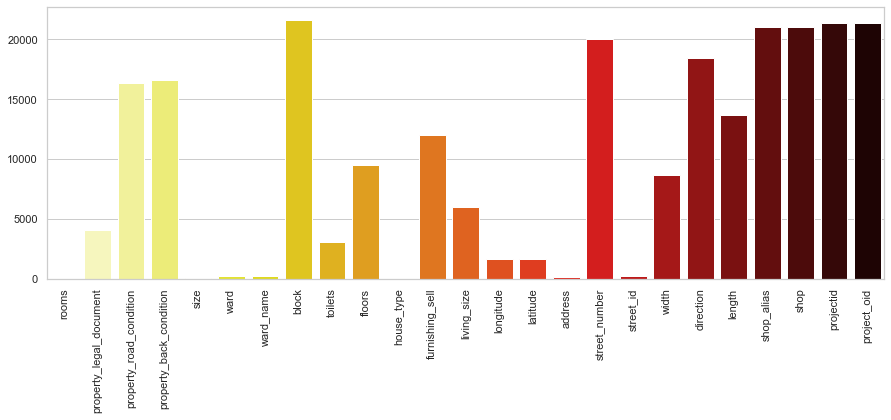

In [6]:
import seaborn as sns

missing = datasets.isnull().sum()
missing = missing[missing > 0]
fig = plt.figure(figsize = (15, 5))
sns.set(style = 'whitegrid')
ax = sns.barplot(x = missing.index.tolist(), y = missing, palette = 'hot_r')
ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
plt.show()

In [7]:
features_numerical = datasets.loc[:, ['size', 'floors', 'rooms', 'width', 'toilets', 'longitude', 'latitude', 'length', 'living_size']]

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:1657: FutureWarning:

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.1 for `bw_method`, but please see the docs for the new parameters and update your code.

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2056: FutureWarning:

The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level fun

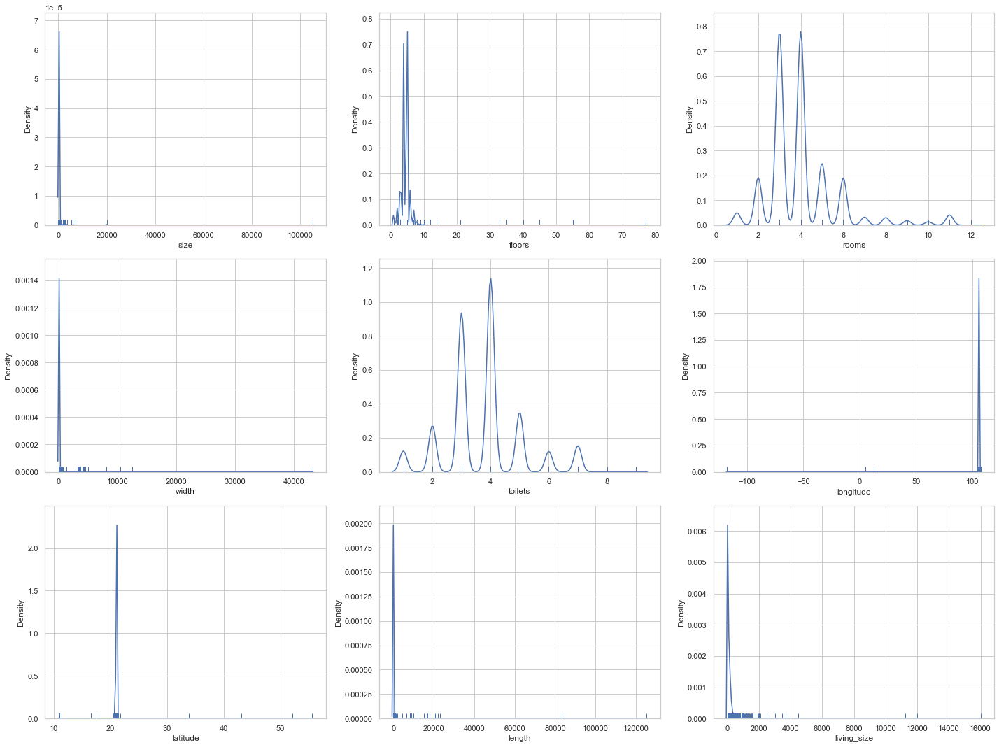

In [8]:
fig = plt.figure(figsize = (20,15))
sns.set(style = 'whitegrid')
for i in range(len(features_numerical.columns)):
    fig.add_subplot(3, 3, i+1)
    sns.distplot(features_numerical.iloc[:,i].dropna(), rug = True, hist = False, kde_kws = {'bw':0.1}, color = 'b')
    plt.xlabel(features_numerical.columns[i])
plt.tight_layout()
plt.show()

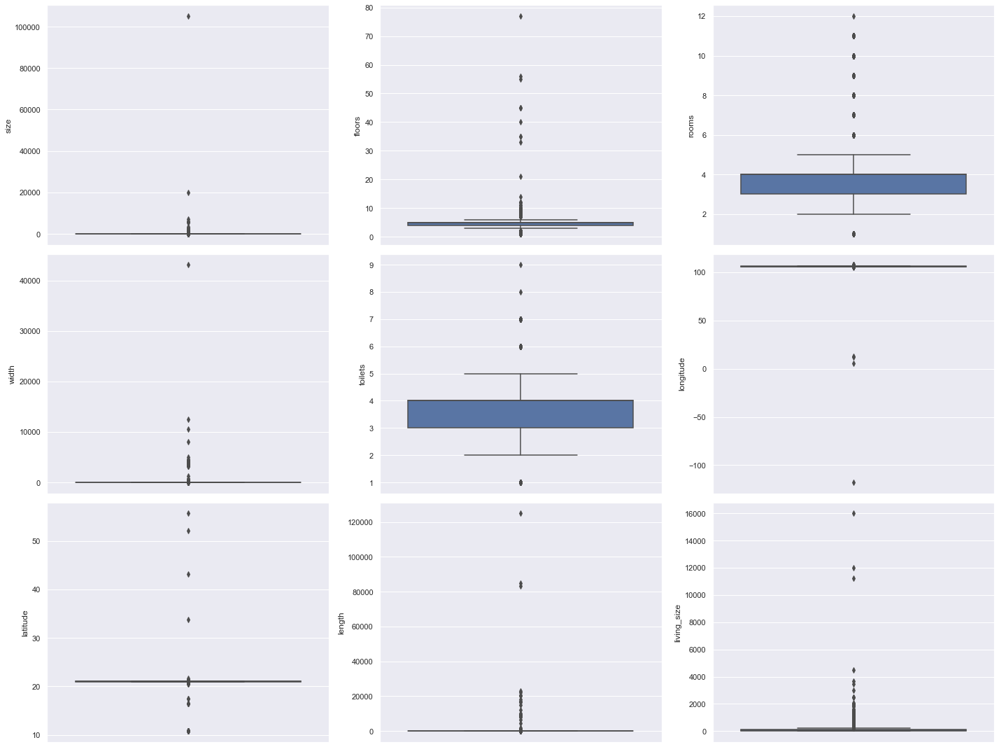

In [9]:
fig = plt.figure(figsize = (20,15))
sns.set(style = 'darkgrid')
for i in range(len(features_numerical.columns)):
    fig.add_subplot(3, 3, i+1)
    sns.boxplot(y = features_numerical.iloc[:,i].dropna())
plt.tight_layout()

D:\Users\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

D:\Users\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

D:\Users\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

D:\Users\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass 

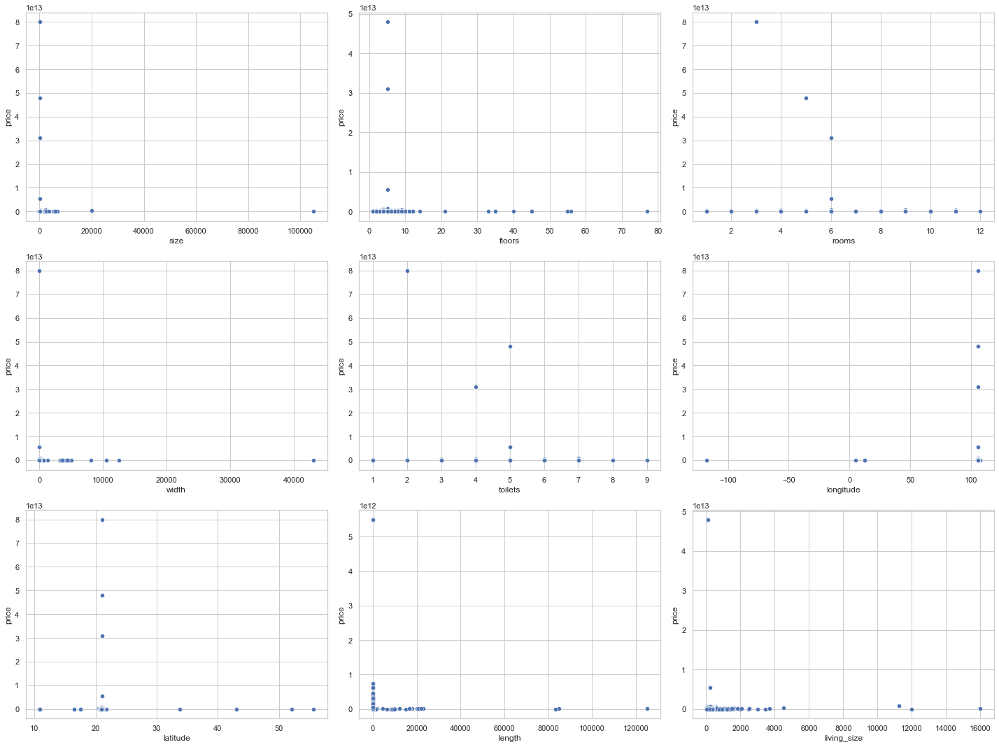

In [10]:
fig = plt.figure(figsize = (20,15))
sns.set(style = 'whitegrid')
for i in range(len(features_numerical.columns)):
    fig.add_subplot(3, 3, i+1)
    sns.scatterplot(features_numerical.iloc[:,i].dropna(), datasets.price)
plt.tight_layout()

<AxesSubplot:>

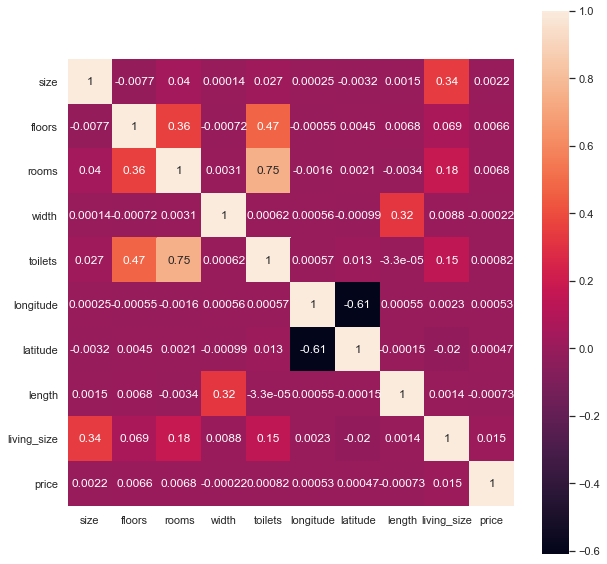

In [11]:
fig = plt.figure(figsize = (10,10))
sns.heatmap(datasets.loc[:, ['size', 'floors', 'rooms', 'width', 'toilets', 'longitude', 'latitude', 
'length', 'living_size', 'price']].corr(), square = True, annot = True)

#### **area**

In [12]:
import plotly.express as px

fig = px.bar(data_frame=datasets['area_name'].value_counts(), text='value')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                 width=1200, height=500, xaxis={'categoryorder':'total descending'})

fig.update_xaxes(automargin=True)

In [13]:
del_area = ['Huyện Đan Phượng', 'Huyện Mê Linh', 'Huyện Chương Mỹ', 'Huyện Quốc Oai', 'Huyện Thường Tín', 'Huyện Mỹ Đức', 'Huyện Thanh Oai', 
    'Huyện Sóc Sơn', 'Huyện Thạch Thất', 'Huyện Phúc Thọ', 'Thị xã Sơn Tây', 'Huyện Ba Vì','Huyện Phú Xuyên', 'Huyện Ứng Hòa', 'Huyện Đông Anh']

In [14]:
datasets.drop(datasets.query('area_name in @del_area').index, inplace=True)

#### **rooms**

In [15]:
fig = px.bar(data_frame=datasets['rooms'].value_counts(), text='value')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                 title = 'rooms', width=1200, height=500, xaxis={'categoryorder':'total descending'})

fig.update_xaxes(automargin=True)

In [16]:
datasets.drop(datasets.query('rooms == 12').index, inplace=True)

#### **floors**

In [17]:
fig = px.bar(data_frame=datasets['floors'].value_counts(), text='value')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                 title = 'floors', width=1200, height=500, xaxis={'categoryorder':'total descending'})

fig.update_xaxes(automargin=True)

In [18]:
datasets.drop(datasets.query('floors > 13').index, inplace=True)

#### **property_legal_document**

In [19]:
# "property_legal_document": {
#     "1": "Đã có sổ",
#     "2": "Đang chờ sổ",
#     "3": "Giấy tờ khác"
#   }

fig = px.bar(data_frame=datasets['property_legal_document'].value_counts(), text='value')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                 title = 'property_legal_document', width=1200, height=500, xaxis={'categoryorder':'total descending'})

fig.update_xaxes(automargin=True)

In [20]:
# df = pd.DataFrame({'A': [0, 1, 2, 3, 4],
#                    'B': [5, 6, 0, 8, 9],
#                    'C': ['a', 'b', 'c', 'd', 'e']})
# df['A'].replace(0, 5, inplace=True)

In [21]:
# datasets['property_legal_document'].replace()

#### **property_road_condition**

In [22]:
fig = px.bar(data_frame=datasets['property_road_condition'].value_counts(), text='value')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                 title = 'property_road_condition', width=1200, height=500, xaxis={'categoryorder':'total descending'})

fig.update_xaxes(automargin=True)

In [23]:
datasets.drop(datasets.query('property_road_condition == 2').index, inplace=True)

#### **property_back_condition**

In [24]:
fig = px.bar(data_frame=datasets['property_back_condition'].value_counts(), text='value')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                 title = 'property_back_condition', width=1200, height=500, xaxis={'categoryorder':'total descending'})

fig.update_xaxes(automargin=True)

#### **house_type**

In [25]:
# "house_type": {
#     "1": "Nhà mặt phố",
#     "2": "Nhà biệt thự",
#     "3": "Nhà ngõ",
#     "4": "Nhà phố liền kề"
#   }

fig = px.bar(data_frame=datasets['house_type'].value_counts(), text='value')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                 title = 'house_type', width=1200, height=500, xaxis={'categoryorder':'total descending'})

fig.update_xaxes(automargin=True)

#### **furnishing_sell**

In [26]:
# "furnishing_sell": {
#     "1": "Nội thất cao cấp",
#     "2": "Nội thất đầy đủ",
#     "3": "Hoàn thiện cơ bản",
#     "4": "Bàn giao thô"
#   }

fig = px.bar(data_frame=datasets['furnishing_sell'].value_counts(), text='value')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                 title = 'furnishing_sell', width=1200, height=500, xaxis={'categoryorder':'total descending'})

fig.update_xaxes(automargin=True)

#### **other**

In [27]:
datasets.area_v2.unique()

array([12081, 12075, 12079, 12086, 12123, 12089, 12080, 12076, 12074,
       12121, 12129, 12078, 12084, 12077, 12073], dtype=int64)

In [28]:
datasets.area.unique()

array([ 81,  75,  79,  86, 123,  89,  80,  76,  74, 121, 129,  78,  84,
        77,  73], dtype=int64)

In [29]:
datasets = datasets.dropna(subset=['size', 'house_type', 'rooms', 'street_id', 'ward'])
# datasets.drop(['body', 'category', 'region_v2', 'subject', 'area', 'region', 'direction',
#                 'shop', 'block', 'projectid', 'shop_alias','unitnumber', 'project_oid', 'street_number'], axis=1, inplace=True)

In [30]:
fig = px.bar(data_frame=datasets.notnull().sum(), text='value')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                 width=1200, height=500, xaxis={'categoryorder':'total descending'}, )

fig.update_xaxes(automargin=True)

### **3. Visual - Remove noisy**

In [31]:
import numpy as np
import seaborn as sns
import plotly.express as px

#### **Size - Price**

In [32]:
px.histogram(datasets['size'], x='size')

In [33]:
datasets.drop(datasets.query('size > 600').index, inplace=True)

In [34]:
px.histogram(datasets['size'], x='size')

In [35]:
# with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
#     display(datasets[datasets['size'] > 300][['size', 'price_string', 'subject', 'body']])

In [36]:
datasets.drop(datasets.query('size > 300 and price < 20e9').index, inplace=True)

In [37]:
# with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
#     display(datasets.query('size > 250 and size < 300')[['size', 'price_string', 'subject', 'body']])

In [38]:
datasets.drop(datasets.query('size > 250 and size < 300 and price < 10e9').index, inplace=True)

In [39]:
# with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
#     display(datasets.query('size > 200 and size < 250 and price < 10e9')[['size', 'price_string', 'floors','subject', 'body']])

In [40]:
datasets.drop(datasets.query('size > 200 and size < 250 and price < 10e9').index, inplace=True)

In [41]:
# with pd.option_context('display.max_colwidth', None):
#     display(datasets[datasets['size'] < 12][['size', 'subject', 'body']])

In [42]:
datasets.drop(datasets.query('size < 12').index, inplace=True)

px.histogram(datasets['size'], x='size')

In [43]:
px.histogram(datasets['price'], x='price')

In [44]:
# with pd.option_context('display.max_colwidth', None):
#     display(datasets[datasets['price'] > 200e9][['price_string', 'size', 'area_name', 'ward_name', 'subject', 'body']])

In [45]:
datasets.drop(datasets.query('price > 200e9 and size < 100').index, inplace=True)

In [46]:
# with pd.option_context('display.max_colwidth', None):
#     display(datasets[datasets['price'] > 200e9][['price_string', 'size', 'area_name', 'ward_name', 'subject', 'body']])

In [47]:
datasets.drop(datasets.query('price > 300e9').index, inplace=True)

In [48]:
datasets.drop(datasets.query('price > 100e9 and price < 200e9 and floors != floors').index, inplace=True)

In [49]:
# with pd.option_context('display.max_colwidth', None):
#     display(datasets.query('price > 100e9 and price < 200e9')[['price_string', 'size', 'area_name', 'ward_name', 'subject', 'body']])

In [50]:
datasets.drop(datasets.query('price > 100e9 and price < 200e9 and size < 100').index, inplace=True)

In [51]:
px.histogram(datasets['price'], x='price')

In [52]:
# with pd.option_context('display.max_colwidth', None):
#     display(datasets[datasets['price'] < 0.5e9][['price', 'size', 'area_name', 'ward_name', 'subject', 'body']])

#### **Price_m2**

In [53]:
datasets['price_m2'] = datasets['price'] / datasets['size']

In [54]:
# with pd.option_context('display.max_colwidth', None):
#     display(datasets.query('price_m2 > 1.1e9')[['price', 'size','subject', 'body']])

In [55]:
datasets.drop(datasets.query('price_m2 > 1.1e9').index, inplace=True)

In [56]:
px.histogram(datasets['price_m2'], x='price_m2')

In [57]:
# with pd.option_context('display.max_rows', None, 'display.max_colwidth', None):
#     display(datasets.query('price_m2 > 0.5e9')[['price_m2', 'area_name','ward_name', 'address', 'floors', 'subject']])

In [58]:
datasets.drop(datasets.query('price_m2 > 0.5e9 and floors != floors').index, inplace=True)

In [59]:
# with pd.option_context('display.max_rows', None, 'display.max_colwidth', None):
#     display(datasets.query('price_m2 > 0.5e9')[['price_m2', 'area_name','price_string',
#                                                  'size', 'floors', 'rooms', 'subject', 'body']].sort_values(by=['price_m2'], ascending=False))

In [60]:
# with pd.option_context('display.max_colwidth', None):
#     display(datasets.query('price_m2 > 1e9')[['price_m2', 'area_name','price_string', 'size', 'floors', 'rooms', 'subject', 'body']])

In [61]:
datasets.drop(datasets.query('price_m2 > 1e9').index, inplace=True)

In [62]:
px.histogram(datasets['price_m2'], x='price_m2')

In [63]:
datasets.query('price_m2 < 2.5e6')['area_name'].value_counts()

Quận Hà Đông         40
Quận Đống Đa         39
Quận Long Biên       38
Quận Hoàng Mai       34
Quận Thanh Xuân      34
Quận Cầu Giấy        24
Quận Hai Bà Trưng    21
Quận Nam Từ Liêm     17
Quận Tây Hồ          14
Huyện Thanh Trì      13
Quận Bắc Từ Liêm     12
Quận Ba Đình          7
Huyện Hoài Đức        5
Huyện Gia Lâm         4
Quận Hoàn Kiếm        4
Name: area_name, dtype: int64

In [64]:
# with pd.option_context('display.max_rows', None, 'display.max_colwidth', None):
#     display(datasets.query('price_m2 < 2.5e6')[['price_m2', 'area_name','ward_name', 'address', 'price_string', 'size', 'subject', 'body']])

In [65]:
datasets.drop(datasets.query('price_m2 < 2.5e6').index, inplace=True)

In [66]:
datasets.query('price_m2 < 7.5e6')['area_name'].value_counts()

Quận Hà Đông         7
Quận Hoàng Mai       7
Quận Thanh Xuân      5
Quận Long Biên       4
Huyện Thanh Trì      3
Quận Ba Đình         3
Quận Cầu Giấy        3
Quận Đống Đa         3
Quận Bắc Từ Liêm     1
Quận Tây Hồ          1
Quận Hai Bà Trưng    1
Name: area_name, dtype: int64

In [67]:
# with pd.option_context('display.max_rows', None, 'display.max_colwidth', None):
#     display(datasets.query('price_m2 < 7.5e6')[['price_m2', 'area_name','ward_name', 'address', 'price_string', 'size', 'subject', 'body']])

In [68]:
datasets.drop(datasets.query('price_m2 < 7.5e6').index, inplace=True)

In [69]:
px.histogram(datasets['price_m2'], x='price_m2')

In [70]:
# with pd.option_context('display.max_rows', None, 'display.max_colwidth', None):
#     display(datasets.query('price_m2 < 10e6')[['price_m2', 'area_name','ward_name', 'address', 'price_string', 'size', 'subject', 'body']])

In [71]:
datasets.drop(datasets.query('price_m2 < 10e6 and price < 600e6').index, inplace=True)

In [72]:
datasets.drop(datasets.query('price < 600e6 and price_m2 < 13e6').index, inplace=True)

In [73]:
# with pd.option_context('display.max_rows', None, 'display.max_colwidth', None):
#     display(datasets.query('price < 0.7e9 and price_m2 < 20e6')[['price_m2', 'area_name','rooms', 'floors', 'price_string', 'size', 'subject', 'body']])

In [74]:
datasets.drop([18063, 20315, 2880], inplace=True)

In [75]:
px.histogram(datasets['price_m2'], x='price_m2')

In [76]:
datasets.query('price_m2 > 500e6')['area_name'].value_counts()

Quận Đống Đa         14
Quận Hoàn Kiếm       13
Quận Cầu Giấy         8
Quận Tây Hồ           8
Quận Hai Bà Trưng     7
Quận Ba Đình          5
Quận Thanh Xuân       1
Quận Hà Đông          1
Name: area_name, dtype: int64

In [77]:
# with pd.option_context('display.max_rows', None, 'display.max_colwidth', None):
#     display(datasets.query('price_m2 > 500e6 and area_name == "Quận Hoàn Kiếm"')[['price_m2', 'ward_name', 'street_id', 'price_string', 'size', 'address','subject', 'body']])

In [78]:
datasets.drop([3530], inplace=True)

In [79]:
datasets.drop([15016], inplace=True)

In [80]:
# with pd.option_context('display.max_rows', None, 'display.max_colwidth', None):
#     display(datasets.query('price_m2 > 500e6 and area_name == "Quận Đống Đa"')[['price_m2', 'ward_name', 'street_id', 'price_string', 'size', 'address','subject', 'body']])

In [81]:
# with pd.option_context('display.max_rows', None, 'display.max_colwidth', None):
#     display(datasets.query('price_m2 > 900e6')[['price_m2', 'ward_name', 'street_id', 'price_string', 'size', 'address','subject', 'body']])

In [82]:
datasets.drop([15829], inplace=True)

In [83]:
px.histogram(x=datasets['price_m2'])

#### **FLoor - room - living_size**

In [84]:
px.scatter(datasets, y='rooms', x='floors')

In [85]:
datasets.floors.count()

12266

In [86]:
# with pd.option_context('display.max_colwidth', None):
#     display(datasets.query('floors > 10')[['floors', 'price_string', 'size','subject', 'body']])

In [87]:
datasets.loc[16823, 'floors'] = 8.0

In [88]:
# test = datasets.dropna(subset=['floors'])
# test.to_csv('pre_data/TestDatasets.csv', index=False)

<function matplotlib.pyplot.show(close=None, block=None)>

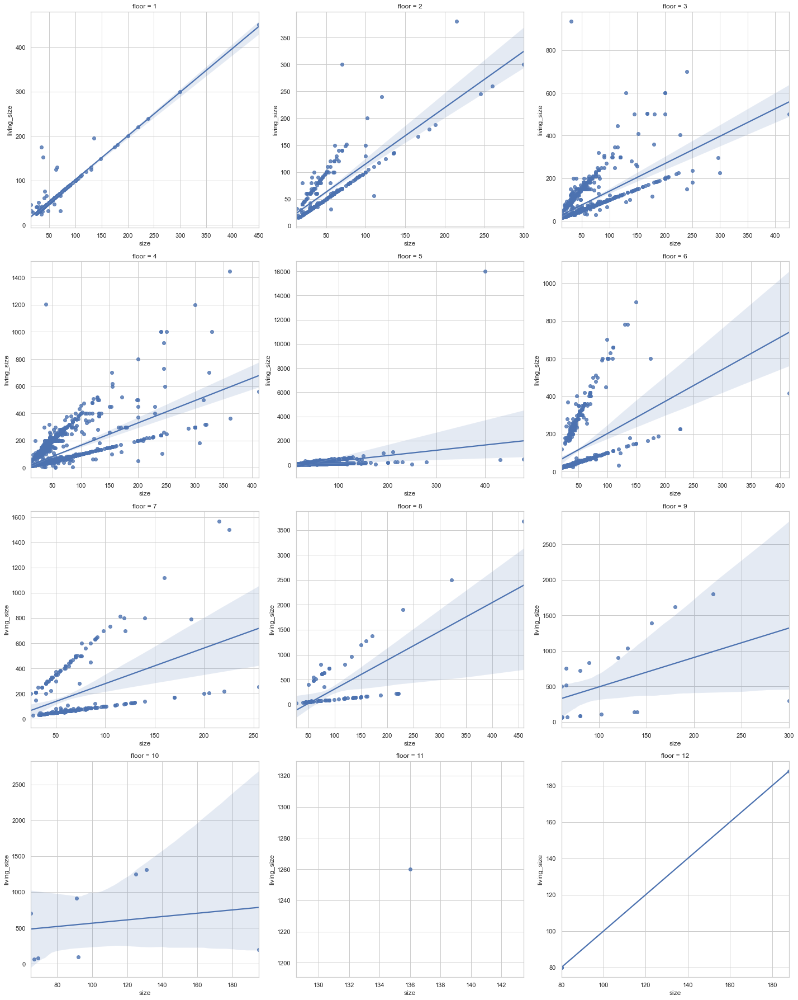

In [89]:
import seaborn as sns

fig = plt.figure(figsize = (20,25))
for i in range(1, 13):
    fig.add_subplot(4, 3, i)
    inp = datasets.query('floors == ' + str(i))[['size', 'living_size']]
    sns.regplot(x=inp['size'], y=inp['living_size'])
    plt.title('floor = {}'.format(i))
plt.tight_layout()
plt.show

In [90]:
inp = datasets.query('floors == 5')[['size', 'living_size']]
fig = px.scatter(x=inp['size'], y=inp['living_size'])
fig.update_layout(title = 5)
fig.show()

In [91]:
datasets.query('floors != floors and living_size==living_size and living_size/size > 1.5')[['floors','subject', 'size', 'living_size']]

,floors,subject,size,living_size
3,NaN,"Nhà 3,5 tầng 62m2 đối diện Nhạc viện Hà Nội",62.0,196.0
6,NaN,Xây mới La Phù giáp La Cả-Dương Nội 3PN có trả...,32.0,100.0
14,NaN,"NHÀ ĐẸP YÊN NGHĨA SIÊU HIẾM 40M2, NGÕ THOÁNG 1...",40.0,120.0
21,NaN,BÁN GẤP NHÀ 3 TẦNG 3 NGỦ CÁCH CHỢ XỐM 2KM SĐCC,30.0,90.0
23,NaN,Nhà số 8 ngõ 58 Đào Tấn Ba Đình 30m2 cách phố 50m,30.0,90.0
...,...,...,...,...
22214,NaN,Bán Nhà Xuân Đỉnh Nhỉnh 3 Tỷ Diện Tích 35 m2,35.0,200.0
22231,NaN,"NHÀ PHÂN LÔ LIÊN MẠC 32M2X5T GIÁ 2,15 TỶ BÁN GẤP",32.0,160.0
22232,NaN,"Bán đất tặng nhà 4 tầng sổ 43m2 Cự Lộc, cực hiếm.",43.0,172.0
22237,NaN,Nhà gần 100m 3 tầng tại Mình Khai giá cực đẹp,95.0,280.0


In [92]:
index = datasets.query('floors != floors and living_size==living_size and living_size/size > 1.5').index
datasets.loc[index, 'floors'] = datasets['living_size']/datasets['size']

In [93]:
# test = datasets.dropna(subset=['floors'])
# test.to_csv('pre_data/TestDatasets(1).csv', index=False)

In [94]:
# datasets.to_csv('pre_data/TestDatasets(2).csv', index=False)

In [95]:
datasets.drop(datasets.query('floors > 12').index, inplace=True)

px.scatter(datasets, x='rooms', y='floors')

#### **longitude, latitude**

In [96]:
px.scatter(datasets, y='latitude', x='longitude', color='area_name')

In [97]:
px.scatter(datasets.query('latitude > 20.8 and latitude < 21.15 and longitude > 15.6 and longitude < 106'), x='longitude', y='price')

In [98]:
px.scatter(datasets.query('latitude > 20.8 and latitude < 21.15 and longitude > 15.6 and longitude < 106'), x='latitude', y='price')

In [99]:
px.scatter_3d(datasets.query('latitude > 20.8 and latitude < 21.15 and longitude > 15.6 and longitude < 106'), x='longitude', y='latitude', z='price', height=800)

In [100]:
datasets.drop(datasets.query('price > 200e9').index, inplace=True)

#### **width-length**

In [101]:
px.histogram(datasets.width)

In [102]:
temp = datasets.drop(datasets.query('width > size').index)

In [103]:
datasets.drop(datasets.query('width > size or width > 30').index, inplace=True)

In [104]:
datasets.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20604 entries, 1 to 22307
Data columns (total 36 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   list_time                20604 non-null  object 
 1   subject                  20604 non-null  object 
 2   body                     20604 non-null  object 
 3   area                     20604 non-null  int64  
 4   area_name                20604 non-null  object 
 5   region                   20604 non-null  int64  
 6   price                    20604 non-null  int64  
 7   price_string             20604 non-null  object 
 8   rooms                    20604 non-null  float64
 9   property_legal_document  16862 non-null  float64
 10  property_road_condition  5604 non-null   float64
 11  property_back_condition  5314 non-null   float64
 12  size                     20604 non-null  float64
 13  region_v2                20604 non-null  int64  
 14  area_v2               

D:\Users\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='width', ylabel='price'>

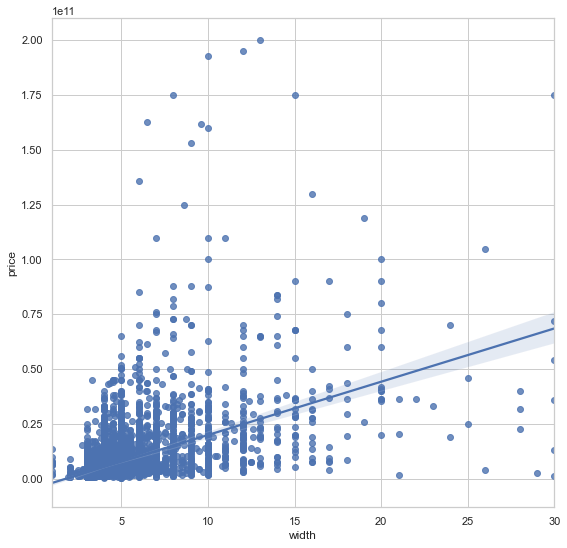

In [105]:
fig = plt.figure(figsize = (9,9))
sns.regplot(datasets['width'], datasets['price'])

In [106]:
px.histogram(datasets.query('length < 200')['length'])

#### **projectid**

In [107]:
with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
    display(datasets.projectid.value_counts())

1.0       594
2248.0     21
2158.0     12
301.0      10
3639.0      8
396.0       8
164.0       6
2222.0      5
3651.0      5
2641.0      4
2679.0      4
2225.0      4
2846.0      3
3162.0      3
90.0        3
1320.0      3
1516.0      3
357.0       3
3555.0      3
1967.0      3
2617.0      3
2274.0      3
3561.0      2
114.0       2
2164.0      2
1812.0      2
2652.0      2
2221.0      2
2634.0      2
3588.0      2
2954.0      2
298.0       2
2188.0      2
393.0       2
3586.0      2
165.0       1
3013.0      1
2795.0      1
1932.0      1
2454.0      1
4.0         1
2300.0      1
2716.0      1
2616.0      1
503.0       1
279.0       1
4105.0      1
4319.0      1
2771.0      1
3254.0      1
1424.0      1
488.0       1
2168.0      1
3785.0      1
4179.0      1
2992.0      1
2361.0      1
5.0         1
4454.0      1
3629.0      1
3577.0      1
3229.0      1
1977.0      1
500.0       1
303.0       1
244.0       1
3523.0      1
1567.0      1
394.0       1
2934.0      1
2523.0      1
356.0 

In [108]:
datasets.projectid.count()

788

In [109]:
px.scatter(datasets, x='projectid', y='price')

In [110]:
datasets.query('price >= 200e9')

,list_time,subject,body,area,area_name,region,price,price_string,rooms,property_legal_document,...,street_number,street_id,width,direction,length,shop_alias,shop,projectid,project_oid,price_m2
12519,16 November 2021,Bán nhà mặt phố Nguyễn Chánh Trung Hòa Cầu Giấy,"🔥🔥🔥 Cần bán mặt nhà mặt Phố Nguyễn Chánh, Trun...",79,Quận Cầu Giấy,12,200000000000,200 tỷ,10.0,1.0,...,NaN,842.0,NaN,NaN,NaN,NaN,NaN,3577.0,639601436.0,4.166667e+08
18391,11 October 2021,Cực phẩm siêu hiếm Thái Hà Phố 416m2 lô góc MT...,Cơ hội suy để sở hữu siêu phẩm Mahattan Thái ...,75,Quận Đống Đa,12,200000000000,200 tỷ,5.0,1.0,...,NaN,431.0,13.0,NaN,35.0,NaN,NaN,NaN,NaN,4.807692e+08


In [111]:
datasets.drop(datasets.query('price >= 200e9').index, inplace=True)

#### **area**

In [112]:
datasets['street_id'].value_counts()

0.0        3163
797.0       316
555.0       232
728.0       213
2301.0      211
           ... 
17.0          1
937.0         1
292.0         1
36143.0       1
2038.0        1
Name: street_id, Length: 1038, dtype: int64

In [113]:
datasets['area_name'].unique()

array(['Quận Long Biên', 'Quận Đống Đa', 'Quận Cầu Giấy', 'Quận Hà Đông',
       'Huyện Hoài Đức', 'Quận Hoàng Mai', 'Quận Hai Bà Trưng',
       'Quận Ba Đình', 'Quận Nam Từ Liêm', 'Quận Bắc Từ Liêm',
       'Quận Tây Hồ', 'Huyện Thanh Trì', 'Quận Thanh Xuân',
       'Quận Hoàn Kiếm', 'Huyện Gia Lâm'], dtype=object)

In [114]:
fig = px.bar(data_frame=datasets['area_name'].value_counts(), text='value')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide', autosize=False, barmode='group',
                 width=1200, height=500, xaxis={'categoryorder':'total descending'})

fig.update_xaxes(automargin=True)

In [115]:
# with pd.option_context('display.max_row', None,):
#     display(datasets.ward_name.value_counts())

##### **- Quận Hoàn Kiếm**

In [116]:
# datasets[datasets['area_name'] == 'Quận Hoàn Kiếm']['ward_name'].value_counts()

In [117]:
# datasets[datasets['area_name'] == 'Quận Hoàn Kiếm']['street_id'].value_counts()

In [118]:
index = datasets.query('area_name == "Quận Hoàn Kiếm" and street_id == 0.0').index

datasets.loc[index, 'address'] = datasets['ward_name']

In [119]:
index = datasets.query('area_name == "Quận Hoàn Kiếm"').index

datasets.loc[index, 'ward_name'] = datasets['area_name']

In [120]:
# datasets[datasets['area_name'] == 'Quận Hoàn Kiếm']['address'].value_counts()

In [121]:
# px.histogram(datasets[datasets['area_name'] == 'Quận Hoàn Kiếm']['size'], x='size')

In [122]:
# sns.distplot(datasets[datasets['area_name'] == 'Quận Hoàn Kiếm']['size'])

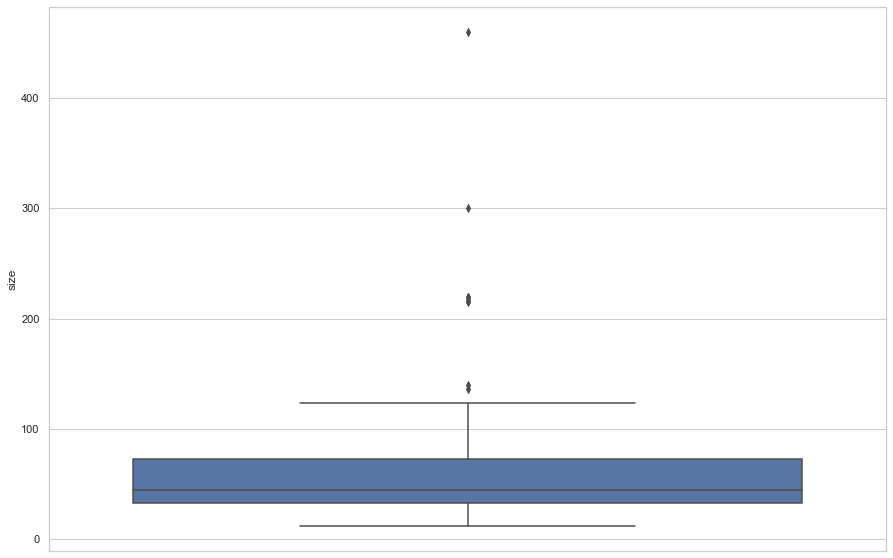

In [123]:
fig = plt.figure(figsize = (15,10))
sns.boxplot(y =datasets[datasets['area_name'] == 'Quận Hoàn Kiếm']['size'])
plt.show()

In [124]:
# with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
#     display(datasets.query('area_name == "Quận Hoàn Kiếm" and size > 150')[['size', 'rooms', 'floors', 'price_string', 'ward_name', 'address', 'subject', 'body']])

In [125]:
# sns.distplot(datasets[datasets['area_name'] == 'Quận Hoàn Kiếm']['price'])

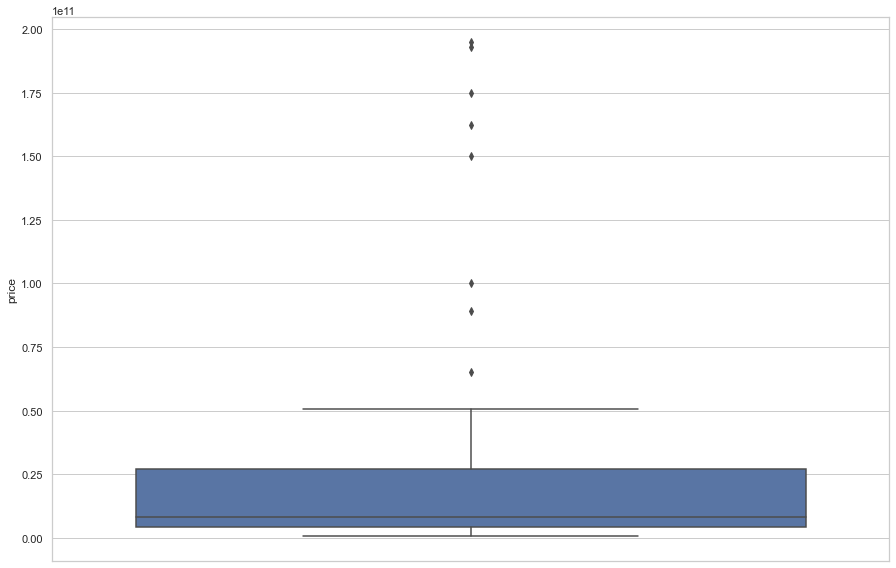

In [126]:
fig = plt.figure(figsize = (15,10))
sns.boxplot(y =datasets[datasets['area_name'] == 'Quận Hoàn Kiếm']['price'])
plt.show()

In [127]:
# with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
#     display(datasets.query('area_name == "Quận Hoàn Kiếm" and price > 6e10')[['size', 'rooms', 'floors', 'price_string', 'ward_name', 'address', 'subject', 'body']])

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price_m2', ylabel='Density'>

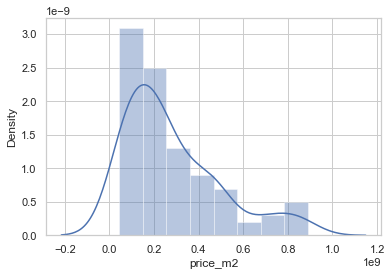

In [128]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Hoàn Kiếm']['price_m2'])

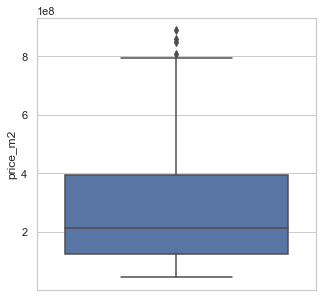

In [129]:
fig = plt.figure(figsize = (5,5))
sns.boxplot(y =datasets[datasets['area_name'] == 'Quận Hoàn Kiếm']['price_m2'])
plt.show()

In [130]:
px.histogram(datasets[datasets['area_name'] == 'Quận Hoàn Kiếm']['price_m2'], x='price_m2')

In [131]:
# with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
#     display(datasets.query('area_name == "Quận Hoàn Kiếm" and price_m2 > 7e8')[['size', 'rooms', 'floors', 'house_type','price_string', 'price_m2', 'subject', 'body']])

In [132]:
datasets.drop([177], inplace=True)

In [133]:
px.scatter(datasets.query('area_name == "Quận Hoàn Kiếm"'), y='latitude', x='longitude', color='ward_name')

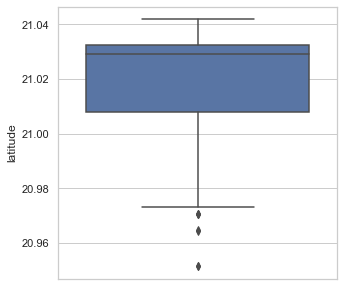

In [134]:
fig = plt.figure(figsize = (5,5))
sns.boxplot(y=datasets.query('area_name == "Quận Hoàn Kiếm" and latitude > 20.95 and latitude < 21.05')['latitude'])
plt.show()

In [135]:
la_mean = datasets.query('area_name == "Quận Hoàn Kiếm" and latitude > 20.98 and latitude < 21.05')['latitude'].mean()

In [136]:
id = datasets.query('area_name == "Quận Hoàn Kiếm" and (latitude < 21.01 or latitude > 21.04)').index
datasets.loc[id, 'latitude'] = la_mean

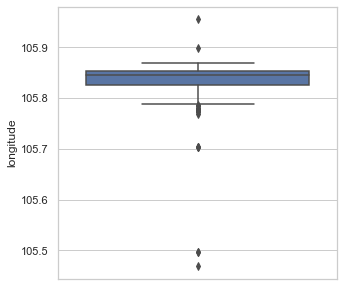

In [137]:
fig = plt.figure(figsize = (5,5))
sns.boxplot(y=datasets.query('area_name == "Quận Hoàn Kiếm" and longitude > 105.4 and longitude < 106')['longitude'])
plt.show()

In [138]:
lo_mean = datasets.query('area_name == "Quận Hoàn Kiếm" and longitude > 105.4 and longitude < 106')['longitude'].mean()

In [139]:
id = datasets.query('area_name == "Quận Hoàn Kiếm" and (longitude < 105.75 or longitude > 105.9)').index
datasets.loc[id, 'longitude'] = lo_mean

In [140]:
px.scatter(datasets.query('area_name == "Quận Hoàn Kiếm"'), y='latitude', x='longitude', color='ward_name', size='price_m2')

##### **- Huyện Gia Lâm**

In [141]:
datasets[datasets['area_name'] == 'Huyện Gia Lâm']['ward_name'].value_counts()

Thị trấn Trâu Quỳ    72
Xã Đông Dư           23
Xã Đặng Xá           23
Xã Đa Tốn            17
Thị trấn Yên Viên     5
Xã Phú Thị            3
Xã Cổ Bi              3
Xã Kiêu Kỵ            2
Xã Kim Sơn            2
Xã Bát Tràng          1
Xã Dương Quang        1
Xã Yên Viên           1
Xã Dương Hà           1
Name: ward_name, dtype: int64

In [142]:
temp = ['Thị trấn Trâu Quỳ', 'Xã Đông Dư', 'Xã Đặng Xá', 'Xã Đa Tốn']
index = datasets.query('area_name == "Huyện Gia Lâm" and ward_name not in @temp').index

datasets.loc[index, 'ward_name'] = 'Xã Huyện Gia Lâm'

In [143]:
datasets[datasets['area_name'] == 'Huyện Gia Lâm']['ward_name'].value_counts()

Thị trấn Trâu Quỳ    72
Xã Đông Dư           23
Xã Đặng Xá           23
Xã Huyện Gia Lâm     19
Xã Đa Tốn            17
Name: ward_name, dtype: int64

In [144]:
datasets[datasets['area_name'] == 'Huyện Gia Lâm']['ward'].value_counts()

192.0    72
195.0    23
189.0    23
196.0    17
179.0     5
190.0     3
188.0     3
197.0     2
191.0     2
198.0     1
193.0     1
181.0     1
184.0     1
Name: ward, dtype: int64

In [145]:
px.histogram(datasets[datasets['area_name'] == 'Huyện Gia Lâm']['size'], x='size')

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='size', ylabel='Density'>

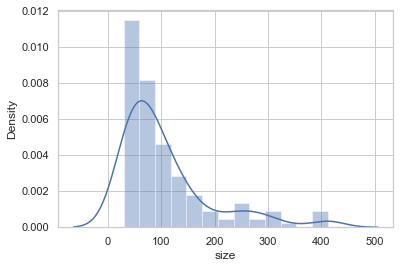

In [146]:
sns.distplot(datasets[datasets['area_name'] == 'Huyện Gia Lâm']['size'])

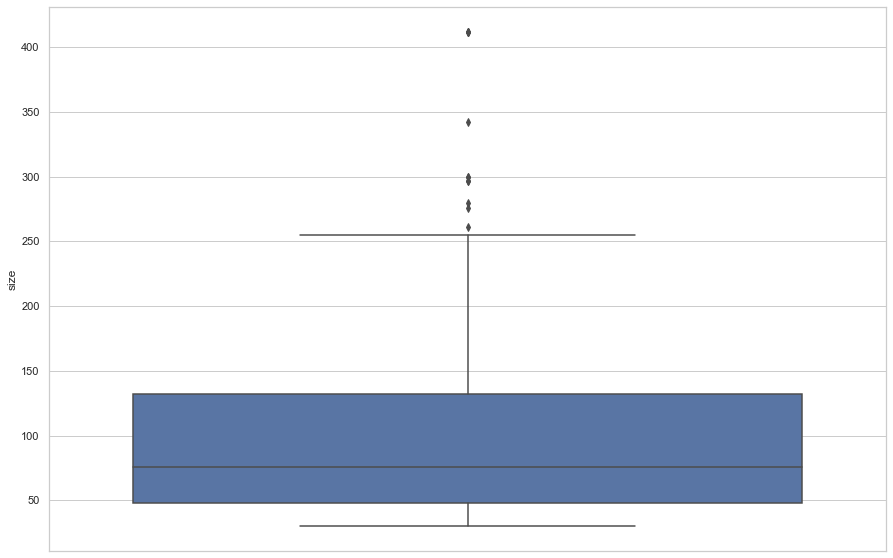

In [147]:
fig = plt.figure(figsize = (15,10))
sns.boxplot(y =datasets[datasets['area_name'] == 'Huyện Gia Lâm']['size'])
plt.show()

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price', ylabel='Density'>

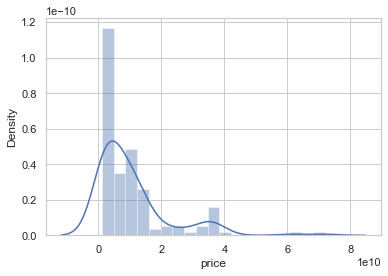

In [148]:
sns.distplot(datasets[datasets['area_name'] == 'Huyện Gia Lâm']['price'])

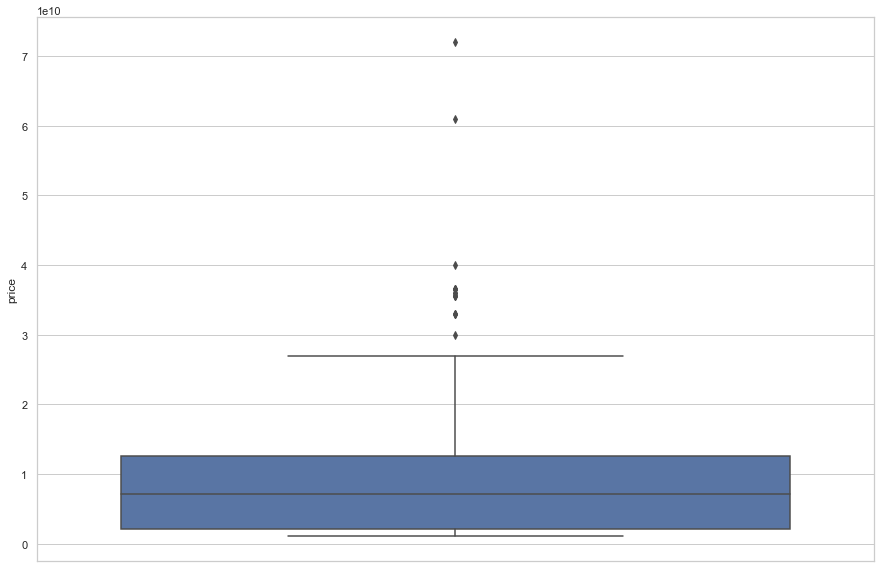

In [149]:
fig = plt.figure(figsize = (15,10))
sns.boxplot(y =datasets[datasets['area_name'] == 'Huyện Gia Lâm']['price'])
plt.show()

In [150]:
with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
    display(datasets.query('area_name == "Huyện Gia Lâm" and price > 6e10')[['size', 'rooms', 'floors', 'price_string', 'ward_name', 'address', 'subject', 'body']])

,size,rooms,floors,price_string,ward_name,address,subject,body
16537,297.0,5.0,NaN,61 tỷ,Thị trấn Trâu Quỳ,Đường Quốc Lộ 5,BIỆT THỰ NGỌC TRAI ĐƠN LẬP VINHOMES OCEAN PARK,"💎 CẦN BÁN ĐƠN LẬP ĐÔNG NAM NGỌC TRAI NT18- Vị trí Kim Cương 💎\n• Diện tích. 297m2\n• Xây dựng 3,5 tầng\n• Diện tích xây dựng 137m2/sàn\n• Tổng Mặt tiền: 10.2m\n• Hướng Đông Nam : Phía sau hướng trực diện hồ, sông.\n• Pháp lý: sổ đỏ lâu dài\n- Vị trí đẹp nhất đảo Ngọc Trai Vinhomes Ocean Park\n\n🍀 Giá bán: 6x tỷ (x tiểu học) 🍀\n\n- Nằm trên khu compound Ngọc Trai với an ninh 24/7, khu VIP được ví như Bằng Lăng mới.\n- Sở hữu bể bơi, công viên, sân tập tennis ngay trong nội khu.\n- Số lượng căn diện tích sàn lớn cực kì hữu hạn\n- Căn đặc biệt khi xẻ khe phía sau view hồ, xẻ khe phía trước không bị chắn nhà.\n- Sở hữu vị trí đẳng cấp nhất trong các căn song lập Đảo Ngọc Trai Vinhomes Ocean Park.\n\nLiên hệ: EM Hoàng An đi xem trực tiếp 24/7"
19465,300.0,4.0,NaN,72 tỷ,Thị trấn Trâu Quỳ,Đường Quốc Lộ 5,"Tôi cần bán BT mặt hồ Vinhomes Ocean Park, Gia Lâm","Tôi chính chủ cần bán Biệt thự đơn lập mặt hồ Vinhomes Ocean park, Gia Lâm, Hà Nội.\nDiện tích: 300m2, đã xây thô hoàn thiện 3 tầng.\nVị trí: HA01 nhìn trực diện ra biển hồ nước ngọt lớn.\nGiá bán: Rẻ thị trường\nxin liên hệ trực tiếp số điện thoại (anh Tuấn Anh)\n\nHiện dự án Vinhomes Ocean Park, Gia Lâm đã hoàn thiện và đi vào sử dụng toàn bộ tiện ích, các công trình công cộng, trung tâm thương mại.\n Vinhomes Ocean Park là đại đô thị hiện đại và sang trọng bậc Việt Nam.\n\n#vinhomes #oceanpark #vincom #vinhomesoceanpark #vinhomesgialam #vinhomes #oceanpark #vincom #vinhomesoceanpark #vinhomesgialam #biethu #bietthuoceanpark #banbiethu #vinhomes #oceanpark #vincom #vinhomesoceanpark #vinhomesgialam #vinhomes #oceanpark #vincom #vinhomesoceanpark #vinhomesgialam #biethu #bietthuoceanpark #banbiethu"


D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price_m2', ylabel='Density'>

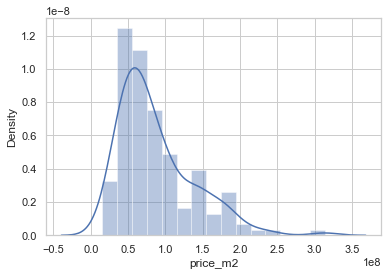

In [151]:
sns.distplot(datasets[datasets['area_name'] == 'Huyện Gia Lâm']['price_m2'])

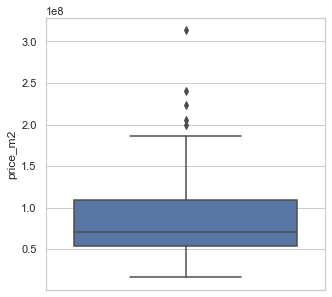

In [152]:
fig = plt.figure(figsize = (5,5))
sns.boxplot(y =datasets[datasets['area_name'] == 'Huyện Gia Lâm']['price_m2'])
plt.show()

In [153]:
with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
    display(datasets.query('area_name == "Huyện Gia Lâm" and price_m2 < 0.2e8')[['size', 'rooms', 'floors', 'house_type','price_string', 'price_m2', 'subject', 'body']])

,size,rooms,floors,house_type,price_string,price_m2,subject,body
4882,104.4,5.0,4.789272,1.0,"1,65 tỷ",1.580460e+07,"Cần bán nhà 3 tầng 104,4m2, mặt phố Ngô Xuân Quảng","Cần bán nhà 3 tầng tại mặt phố Ngô Xuân Quảng, Trâu Quỳ, Gia Lâm.\n\n+ Diện tích: 104,4m2, mặt tiền và hậu 4m, đường trước nhà rộng 20m, hướng Tây.\n\n+ Giá bán: 16.5 tỷ ( có ra lộc cho người mua thiện chí ).\n\n+ Nhà nằm trên 2 mặt đường, đường sau nhà rộng 4m ô tô 7 chỗ chạy thông. Vị trí đẹp để kinh doanh, xung quanh đông dân sầm uất, thích hợp mua ở, làm văn phòng hoặc cho thuê kinh doanh...\n\n+ Pháp lý: Sổ đỏ chính chủ, không cầm cố, sẵn sàng công chứng, hỗ trợ vay bank.\n\nLiên hệ trước 30 phút để xem đất!\nPhuLam.Vn – Cam Kết Bán Đúng Giá - Không Thu Phí Người Mua - Hỗ Trợ Thủ Tục Sang Tên!"


In [154]:
datasets.drop([4882], inplace=True)

In [155]:
with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
    display(datasets.query('area_name == "Huyện Gia Lâm" and price_m2 > 3e8')[['size', 'rooms', 'floors', 'house_type','price_string', 'price_m2', 'subject', 'body']])

,size,rooms,floors,house_type,price_string,price_m2,subject,body
11107,105.3,3.0,NaN,2.0,33 tỷ,3.133903e+08,🔔 💥 HÀNĐẸP !!! ĐỘC QUYỀN TẠI VinhomesOceanPark,"🔔 💥 HÀNG HOT!!! ĐỘC QUYỀN TẠI VinhomesOceanPark \n/-rose Chuyển nhượng Biệt thự song lập Ngọc trai NT18-21 . \n💥 Tâm điểm của tâm điểm, khu vực chỉ dành cho giới nhà GIÀU. \n🔥 Vị trí Đảo Ngọc Trai lớn. Đối diện Quảng trường Ocean View 15.000m2. \n💥 Khu vực luôn khan hiếm hàng chuyển nhượng, DIện tích 150.3m2, Xây dựng 80m2x4 tầng. \n💥 Giá bán : 33 tỷ bao thuế phí CN sang tên (Còn thương lượng nhẹ cho khách thiện chí)"


In [156]:
datasets.drop([11107], inplace=True)

In [157]:
px.scatter(datasets.query('area_name == "Huyện Gia Lâm"'), x='ward_name', y='price')

In [158]:
with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
    display(datasets.query('area_name == "Huyện Gia Lâm" and price > 50e9')[['size', 'rooms', 'floors', 'house_type','price_string', 'price_m2', 'subject', 'projectid']])

,size,rooms,floors,house_type,price_string,price_m2,subject,projectid
16537,297.0,5.0,NaN,2.0,61 tỷ,2.053872e+08,BIỆT THỰ NGỌC TRAI ĐƠN LẬP VINHOMES OCEAN PARK,2248.0
19465,300.0,4.0,NaN,2.0,72 tỷ,2.400000e+08,"Tôi cần bán BT mặt hồ Vinhomes Ocean Park, Gia Lâm",2248.0


In [159]:
px.scatter(datasets.query('area_name == "Huyện Gia Lâm"'), x='ward_name', y='price_m2')

In [160]:
datasets.drop(datasets.query('ward_name == "Xã Đa Tốn" and area_name == "Huyện Gia Lâm" and price_m2 > 150e6').index, inplace=True)

In [161]:
px.scatter(datasets.query('area_name == "Huyện Gia Lâm"'), y='latitude', x='longitude', color='ward_name')

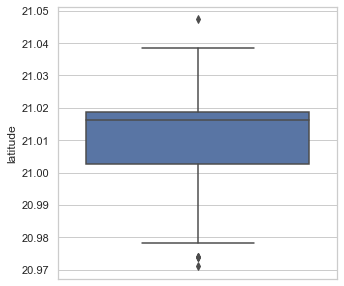

In [162]:
fig = plt.figure(figsize = (5,5))
sns.boxplot(y=datasets.query('area_name == "Huyện Gia Lâm" and latitude > 20.95 and latitude < 21.05')['latitude'])
plt.show()

In [163]:
la_mean = datasets.query('area_name == "Huyện Gia Lâm" and latitude > 20.98 and latitude < 21.05')['latitude'].mean()

In [164]:
id = datasets.query('area_name == "Huyện Gia Lâm" and (latitude < 20.98 or latitude > 21.04)').index
datasets.loc[id, 'latitude'] = la_mean

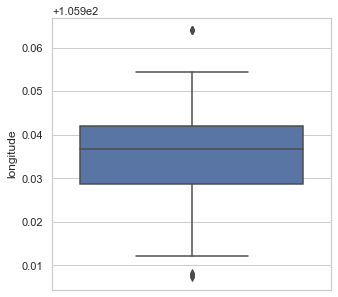

In [165]:
fig = plt.figure(figsize = (5,5))
sns.boxplot(y=datasets.query('area_name == "Huyện Gia Lâm" and longitude > 105.9 and longitude < 106')['longitude'])
plt.show()

In [166]:
lo_mean = datasets.query('area_name == "Huyện Gia Lâm" and longitude > 105.9 and longitude < 106')['longitude'].mean()

In [167]:
id = datasets.query('area_name == "Huyện Gia Lâm" and (longitude < 105.9 or longitude > 106.0)').index
datasets.loc[id, 'longitude'] = lo_mean

In [168]:
px.scatter(datasets.query('area_name == "Huyện Gia Lâm"'), y='latitude', x='longitude', color='ward_name')

##### **- Huyện Hoài Đức**

In [169]:
datasets[datasets['area_name'] == 'Huyện Hoài Đức']['ward_name'].value_counts()

Xã La Phù             44
Xã Đông La            39
Xã Vân Canh           36
Xã An Khánh           32
Xã Kim Chung          24
Xã Di Trạch           20
Xã An Thượng          10
Thị trấn Trạm Trôi     9
Xã Đức Thượng          8
Xã Vân Côn             4
Xã Đức Giang           1
Name: ward_name, dtype: int64

In [170]:
temp = ['Xã Đông La', 'Xã An Khánh', 'Xã Kim Chung', 'Xã La Phù', 'Xã Vân Canh', 'Xã Di Trạch']
index = datasets.query('area_name == "Huyện Hoài Đức" and ward_name not in @temp').index

datasets.loc[index, 'ward_name'] = 'Xã Huyện Hoài Đức'

In [171]:
datasets.query('area_name == "Huyện Hoài Đức"')[['ward_name']].value_counts()

ward_name        
Xã La Phù            44
Xã Đông La           39
Xã Vân Canh          36
Xã An Khánh          32
Xã Huyện Hoài Đức    32
Xã Kim Chung         24
Xã Di Trạch          20
dtype: int64

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='size', ylabel='Density'>

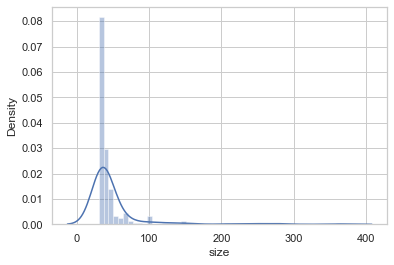

In [172]:
sns.distplot(datasets[datasets['area_name'] == 'Huyện Hoài Đức']['size'])

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price', ylabel='Density'>

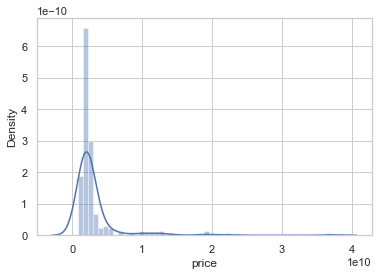

In [173]:
sns.distplot(datasets[datasets['area_name'] == 'Huyện Hoài Đức']['price'])

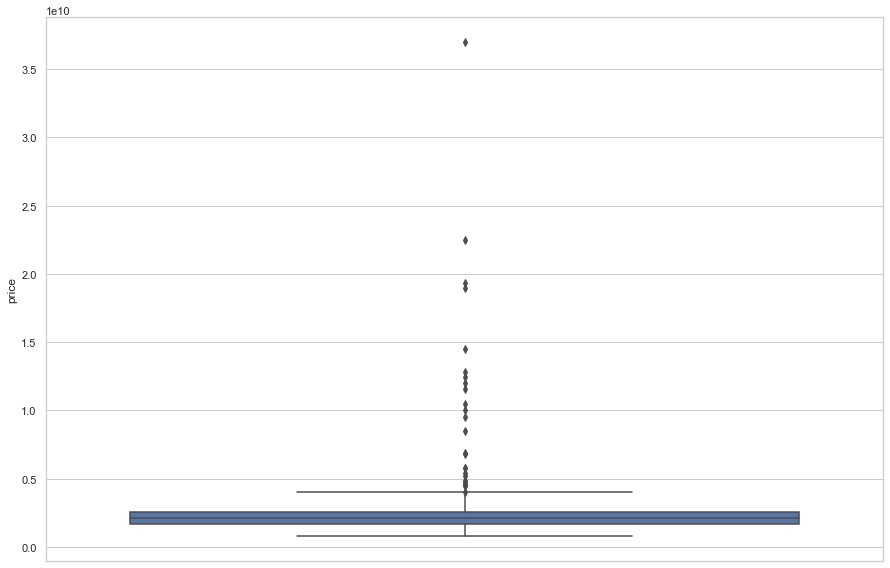

In [174]:
fig = plt.figure(figsize = (15,10))
sns.boxplot(y =datasets[datasets['area_name'] == 'Huyện Hoài Đức']['price'])
plt.show()

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price_m2', ylabel='Density'>

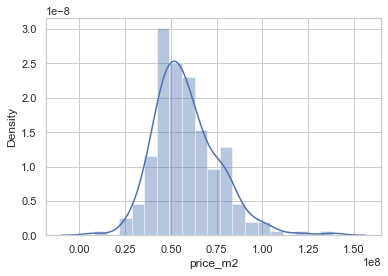

In [175]:
sns.distplot(datasets[datasets['area_name'] == 'Huyện Hoài Đức']['price_m2'])

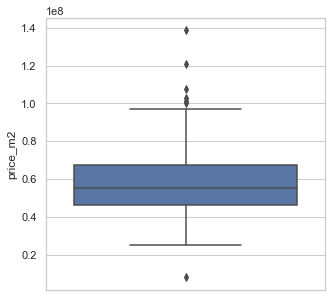

In [176]:
fig = plt.figure(figsize = (5,5))
sns.boxplot(y =datasets[datasets['area_name'] == 'Huyện Hoài Đức']['price_m2'])
plt.show()

In [177]:
with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
    display(datasets.query('area_name == "Huyện Hoài Đức" and price_m2 < 10e6')[['size', 'rooms', 'floors', 'house_type','price_string', 'price_m2', 'subject', 'body']])

,size,rooms,floors,house_type,price_string,price_m2,subject,body
1411,100.0,3.0,NaN,3.0,800 triệu,8000000.0,"Bán nhà Cấp 4 100 m2 xã An Thượng, Hoài Đức","Chính chủ cần bán Nhà cấp 4, diện tích 100m2 có 03 phòng ngủ. Hiện đang cho sinh viên thuê 5 triệu/tháng. Có đầy đủ 03 giường, gác xép, 03 điều hòa mới, 01 máy giặt. Có nước sạch đầy đủ tiện ích. \n\nCách Học viện Chính sách và Phát triển 1km. \n\nĐầy đủ tiện ích\n\n(Công chứng vi bằng)"


In [178]:
datasets.drop([1411], inplace=True)

In [179]:
with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
    display(datasets.query('area_name == "Huyện Hoài Đức" and price_m2 > 1.2e8')[['size', 'rooms', 'floors', 'house_type','price_string', 'price_m2', 'subject', 'body']])

,size,rooms,floors,house_type,price_string,price_m2,subject,body
5935,90.0,4.0,3.0,2.0,"12,474 tỷ",1.386000e+08,"Biệt Thự 3 tầng , đường vành đai 3.5 , Hà Nội","Dự án: An lạc green suymphony\nThông tin chi tiết: một em Hoa Hậu C3-lk26 trong khu đô thị 5 sao của dự án an lạc green suymphony nằm sát cạnh Mỹ Đình,Hà Nội.Đại đô thị được ví như Mỹ đình thứ 2 của Hà nội . C3-LK 26 nằm ngay trục chính đại lộ ánh trăng với mặt đường rộng 13.5m mặt tiền 5m được nối ra 2 con đường lớn là đường 70 và đường vành đai 3.5 . Thiết kế độc đáo mang đậm chất pháp với 3 tầng 1 tum . Vị trí đắc địa vừa có thể sinh lời nhờ cho thuê vừa có thể kinh doanh . Đặc biệt cư dân khu đô thị này là 42000 dân càng làm tôn lên vẻ đắc địa phù hợp với kinh doanh của bạn . Hơn nữa kế cạnh sau lưng là công viên vừa thích hợp cho việc nghỉ ngơi nếu ơi lâu dài và vô số tiện ích của khu đô thị 5 sao đầu tiên ở Hà Nội sẽ giúp bạn có một cuộc sống thật vui vẻ và hạnh phúc đúng như cái tên an lạc của dự án . Trân trọng"
6137,48.0,4.0,5.0,2.0,"5,8 tỷ",1.208333e+08,"Bán biệt thự khu đô thị Nam An Khánh, 48m2","Vị trí đẹp: thoáng mát \n-Vị trí : Đường rộng thênh thang thoáng đãng. \n-Diện tích: 48m2 , Sổ đỏ chính chủ, pháp lý sạch.\n-Giá: 5,8 tỷ ( Có thương lượng ).\nMiễn môi giới và trung gian..!\nLiên hệ Thoan ak \n(Liên hệ để được tư vấn, xem nhà hoàn toàn miễn phí).\nTôi đang có rất nhiều căn nhà với nhiều phân khúc khác nhau."


In [180]:
datasets.drop([5935, 6137], inplace=True)

In [181]:
px.scatter(datasets[datasets['area_name'] == 'Huyện Hoài Đức'], x='ward_name', y='price_m2')

In [182]:
datasets.drop(datasets.query('ward_name == "Xã Kim Chung" and price_m2 < 40e6').index, inplace=True)

In [183]:
with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
    display(datasets.query('ward_name == "Xã La Phù" and price_m2 > 70e6')[['size', 'rooms', 'floors', 'house_type','price_string', 'price_m2', 'subject', 'body']])

,size,rooms,floors,house_type,price_string,price_m2,subject,body
16994,32.0,4.0,4.0,3.0,"2,85 tỷ",89062500.0,BÁN GẤP NHÀ RẺ_ ĐẸP_ HOÀI ĐỨC,"CẦN BÁN GẤP VÀ NGAY ĐỂ ĐI ĐỊNH CƯ NƯỚC NGOÀI Ạ. KHU VỰC LAI XÁ_ HOÀI ĐỨC.\n\nLAI XÁ 32M2 x 4 TẦNG - 4 NGỦ - TẶNG NỘI THẤT - SỔ NỞ HẬU PHÂN LÔ - GẦN Ô TÔ \nHướng: Đông Bắc.\n\nNgõ 196 Lai Xá 32m. 4 tầng. MT: 5m. Giá: 2.85 tỷ Hoài Đức\n\n- Nhà 4 tầng 4 WC, khép kín, tầng 4 chia 2 phòng ngủ, tổng 4 ngủ\n\n Chủ nhà chuẩn bị sang nước ngoài ở nên để lại nội thất cho khách có nhu cầu: 4 điều hoà 2 chiều, 3 giường gỗ xoan đào, 3 đệm, 5 tủ quần áo, bàn ghế bếp ăn, sofa phòng khách, thiết bị vệ sinh..\n\n- Sổ đỏ phân lô nở hậu nhẹ đẹp hiếm\n( MÌNH KHÔNG LÀM VIỆC VỚI CÁC BẠN MÔI GIỚI VÀ TRUNG GIAN NHÉ. CẢM ƠN CÁC BẠN)"


In [184]:
datasets.drop([16994, 5418, 2755, 3739], inplace=True)

In [185]:
px.scatter(datasets[datasets['area_name'] == 'Huyện Hoài Đức'], x='ward_name', y='price')

In [186]:
datasets.drop(datasets.query('ward_name == "Xã Đông La" and price > 5e9').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Xã An Khánh" and price > 20e9').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Xã Kim Chung" and price > 4').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Xã Vân Canh" and price > 15e9').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Xã Di Trạch" and price > 5e9').index, inplace=True)

In [187]:
px.scatter(datasets.query('area_name == "Huyện Hoài Đức"'), y='latitude', x='longitude', color='ward_name')

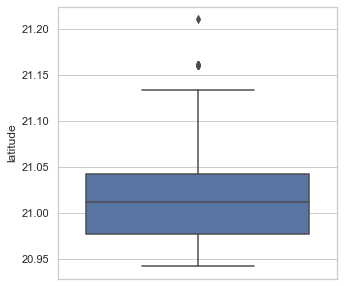

In [188]:
fig = plt.figure(figsize = (5,5))
sns.boxplot(y=datasets.query('area_name == "Huyện Hoài Đức" and latitude > 20.9 and latitude < 21.5')['latitude'])
plt.show()

In [189]:
la_mean = datasets.query('area_name == "Huyện Hoài Đức" and latitude > 20.9 and latitude < 21.5')['latitude'].mean()

In [190]:
id = datasets.query('area_name == "Huyện Hoài Đức" and (latitude < 20.9 or latitude > 21.5)').index
datasets.loc[id, 'latitude'] = la_mean

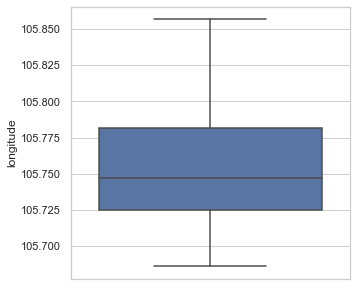

In [191]:
fig = plt.figure(figsize = (5,5))
sns.boxplot(y=datasets.query('area_name == "Huyện Hoài Đức" and longitude > 105.65 and longitude < 105.9')['longitude'])
plt.show()

In [192]:
lo_mean = datasets.query('area_name == "Huyện Hoài Đức" and longitude > 105.65 and longitude < 105.9')['longitude'].mean()

In [193]:
id = datasets.query('area_name == "Huyện Hoài Đức" and (longitude < 105.65 or longitude > 105.9)').index
datasets.loc[id, 'longitude'] = lo_mean

In [194]:
px.scatter(datasets.query('area_name == "Huyện Hoài Đức"'), y='latitude', x='longitude', color='ward_name')

##### **- Huyện Thanh Trì**

In [195]:
datasets[datasets['area_name'] == 'Huyện Thanh Trì']['ward_name'].value_counts()

Xã Tả Thanh Oai      122
Xã Tân Triều         101
Xã Thanh Liệt         75
Xã Tứ Hiệp            64
Thị trấn Văn Điển     60
Xã Tam Hiệp           50
Xã Vĩnh Quỳnh         47
Xã Ngọc Hồi           45
Xã Ngũ Hiệp           29
Xã Liên Ninh          27
Xã Hữu Hoà            25
Xã Đông Mỹ            21
Xã Vạn Phúc            7
Xã Đại áng             4
Xã Duyên Hà            1
Name: ward_name, dtype: int64

In [196]:
temp = ['Xã Duyên Hà', 'Xã Đại áng', 'Xã Vạn Phúc', 'Xã Đông Mỹ']
index = datasets.query('area_name == "Huyện Thanh Trì" and ward_name in @temp').index

datasets.loc[index, 'ward_name'] = 'Xã Huyện Thanh Trì'

In [197]:
datasets[datasets['area_name'] == 'Huyện Thanh Trì']['ward_name'].value_counts()

Xã Tả Thanh Oai       122
Xã Tân Triều          101
Xã Thanh Liệt          75
Xã Tứ Hiệp             64
Thị trấn Văn Điển      60
Xã Tam Hiệp            50
Xã Vĩnh Quỳnh          47
Xã Ngọc Hồi            45
Xã Huyện Thanh Trì     33
Xã Ngũ Hiệp            29
Xã Liên Ninh           27
Xã Hữu Hoà             25
Name: ward_name, dtype: int64

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='size', ylabel='Density'>

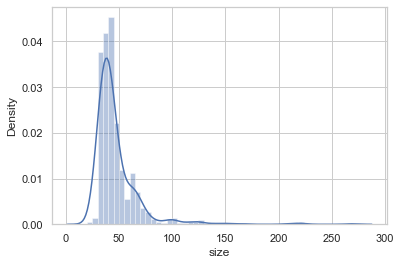

In [198]:
sns.distplot(datasets[datasets['area_name'] == 'Huyện Thanh Trì']['size'])

In [199]:
with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
    display(datasets.query('area_name == "Huyện Thanh Trì" and size > 200')[['size', 'rooms', 'floors', 'price_string', 'ward_name', 'address', 'subject', 'body']])

,size,rooms,floors,price_string,ward_name,address,subject,body
2798,210.0,5.0,NaN,"21,5 tỷ",Xã Tân Triều,Đường Yên Xá,BIỆT THỰ ĐẲNG CẤP TỔNG CỤC 5 YÊN XÁ D 210.GIÁ 21.5,KHU VỰC TỔNG CỤC 5 LÀ MỘT NƠI ĐÁNG SỐNG PHONG CÁCH GIỚI THƯỢNG LƯU\nTIỆN ÍCH 5 SAO HỘI TỤ NHIỀU GIỚI DOANH NHÂN THÀNH ĐẠT CÁN BỘ HỌC VIỆN AN NINH\nMUA 1 ĐƯỢC 2 HÀNG XÓM TOÀN CÔNG CHỨC NHÀ NƯỚC VỀ HƯU HỌC VIỆN AN NINH\nGẦN NHIỀU TRƯỜNG ĐẠI HỌC.TRUNG TÂM QUẬN HÀ ĐÔNG.Ở SƯỚNG AN SINH ĐỈNH CAO\nKHU VỰ PHÁT TRIỂN GIÁ TRỊ TĂNG DÂN TRÍ CAO.KHÔNG GIAN SỐNG TRONG LÀNH\nGIÁ THƯƠNG LƯỢNG .SỔ ĐỎ CHÍNH CHỦ.ANH CHỊ XEM NHÀ LIÊN HỆ MR VINH NHÀ ĐẸP
9822,269.0,4.0,3.0,14 tỷ,Xã Tân Triều,Đường Tân Triều,"Nhà Tân Triều, 3 tầng có sân vườn rộng rãi, 269m2","Bán nhà Tân Triều, 50m ra đường ô tô tránh, 400m ra ngõ 300 Nguyễn Xiển, 269m2, 3 tầng, giá 14 tỷ\nDiện tích 269m2 bao gồm nhà 3 tầng xây mới cực đẹp và 1 nhà cấp 4 , sân rộng trồng cây cực đẹp, thoáng mát.\n\n+ Giao thông thuận lợi di chuyển, 400m ra mặt đường Nguyễn Xiển, tiện ích ngập tràn quanh nhà..\n+ Khu vực rất sôi động, gần sân chơi cộng đồng, trường cấp 1,2, gần chợ triều khúc.\n\n+ Sổ vuông vắn, pháp lý đảm bảo sang tên nhanh gọn."
14209,221.0,3.0,3.0,25 tỷ,Thị trấn Văn Điển,Đường Tứ Hiệp,"Bán khu biệt thự phân lô , đường oto tránh .","Dự án: Bán nhà Tứ Hiệp , Thanh Trì , khu nhà VIP ở Thanh Trì.\n Thông tin chi tiết: -Vị trí. Nhà nằm trong khu phân lô Biệt Thự Tứ Hiệp - Thanh Trì.phía sau nhà là toà nhà trung cư tecco.Nhà nằm trên trục Phân lô từ đường Quốc Lộ 1A vào lối với Đường Trần Thủ Độ.\n- Mô tả. Trước nhà là đường Phân lô vỉa hè rộng đường Thông hè thoáng khu vực hội tụ toàn các đại gia giàu có của Huyện Thanh trì.\n- Tầng 1. Để Thông sàn Kinh Doanh khu Để xe khu vệ sinh.\n- Tầng 2 Khu văn phòng khu kinh doanh của công ty.\n- Tầng 3 với khu Phòng ngủ khu vệ sinh khu văn phòng.\n- Nhà có vị trí đắc địa khu phân lô biệt thự tứ hiệp thanh trì.khu vực rất hiếm nhà bán."
21165,220.0,5.0,NaN,"21,5 tỷ",Xã Tân Triều,Đường Chu Văn An,"Bán biệt thự Tổng cục 5 Tân Triều 220m 4T 21,5 tỷ","Dự án: Bán biệt thự Tổng cục 5 Tân Triều 220m 4T 21,5 tỷ.\n Thông tin chi tiết: Bán biệt thự Tổng cục 5 Tân Triều 220m 4T 21,5 tỷ\n- Vị trí biệt thự tọa lạc tại trung tâm rất đẹp, nơi dân cư đông đúc dân trí cao, an sinh tốt.\n- Tổng cục 5 Tân Triều cơ sở hạ tầng đồng bộ mát mẻ với mật độ cây xanh dầy, vỉa hè rộng.\n-Tổng cục 5 Tân Triều nằm sát Khu đô thị The Manor Central Park - Giá trị nhà tăng lên từng ngày\n- Cách đường Nguyễn Xiển 500m, Cách khu đô thị Xa La 500m, cách Khu đô thị Linh đàm 1km, gần các bệnh viện lớn.\n- Diện tích: 220m 4T 21,5 tỷ (thương lượng mạnh).\n- Sổ đỏ chính chủ.\n- Hỗ trợ các thủ tục pháp lý từ A - Z.\n- Miễn môi giới và trung gian.\n- Liên hệ: Mai Phương - Sinh năm 1977."


D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price', ylabel='Density'>

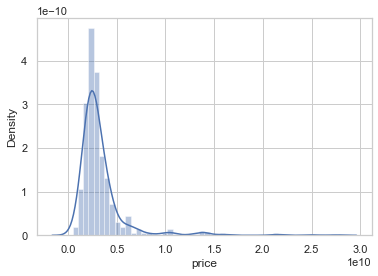

In [200]:
sns.distplot(datasets[datasets['area_name'] == 'Huyện Thanh Trì']['price'])

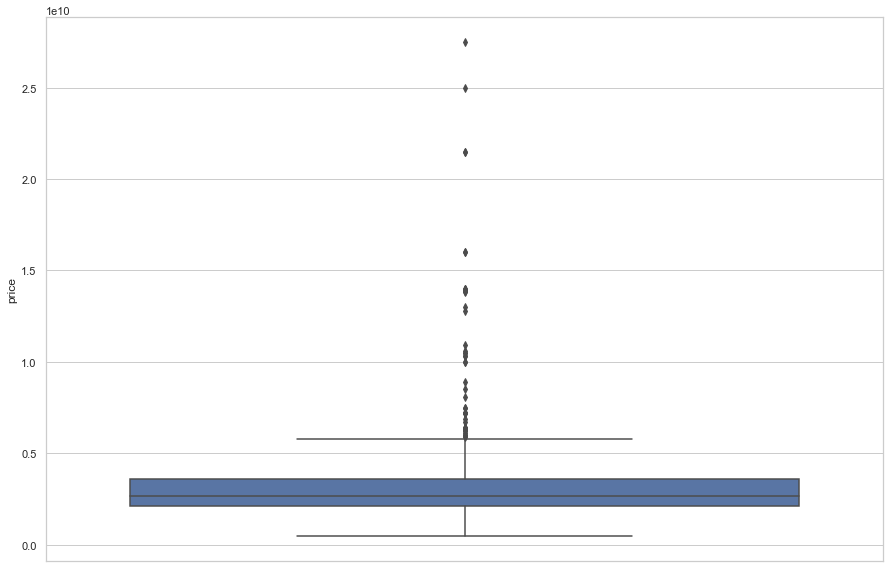

In [201]:
fig = plt.figure(figsize = (15,10))
sns.boxplot(y =datasets[datasets['area_name'] == 'Huyện Thanh Trì']['price'])
plt.show()

In [202]:
with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
    display(datasets.query('area_name == "Huyện Gia Lâm" and price > 6e10')[['size', 'rooms', 'floors', 'price_string', 'ward_name', 'address', 'subject', 'body']])

,size,rooms,floors,price_string,ward_name,address,subject,body
16537,297.0,5.0,NaN,61 tỷ,Thị trấn Trâu Quỳ,Đường Quốc Lộ 5,BIỆT THỰ NGỌC TRAI ĐƠN LẬP VINHOMES OCEAN PARK,"💎 CẦN BÁN ĐƠN LẬP ĐÔNG NAM NGỌC TRAI NT18- Vị trí Kim Cương 💎\n• Diện tích. 297m2\n• Xây dựng 3,5 tầng\n• Diện tích xây dựng 137m2/sàn\n• Tổng Mặt tiền: 10.2m\n• Hướng Đông Nam : Phía sau hướng trực diện hồ, sông.\n• Pháp lý: sổ đỏ lâu dài\n- Vị trí đẹp nhất đảo Ngọc Trai Vinhomes Ocean Park\n\n🍀 Giá bán: 6x tỷ (x tiểu học) 🍀\n\n- Nằm trên khu compound Ngọc Trai với an ninh 24/7, khu VIP được ví như Bằng Lăng mới.\n- Sở hữu bể bơi, công viên, sân tập tennis ngay trong nội khu.\n- Số lượng căn diện tích sàn lớn cực kì hữu hạn\n- Căn đặc biệt khi xẻ khe phía sau view hồ, xẻ khe phía trước không bị chắn nhà.\n- Sở hữu vị trí đẳng cấp nhất trong các căn song lập Đảo Ngọc Trai Vinhomes Ocean Park.\n\nLiên hệ: EM Hoàng An đi xem trực tiếp 24/7"
19465,300.0,4.0,NaN,72 tỷ,Thị trấn Trâu Quỳ,Đường Quốc Lộ 5,"Tôi cần bán BT mặt hồ Vinhomes Ocean Park, Gia Lâm","Tôi chính chủ cần bán Biệt thự đơn lập mặt hồ Vinhomes Ocean park, Gia Lâm, Hà Nội.\nDiện tích: 300m2, đã xây thô hoàn thiện 3 tầng.\nVị trí: HA01 nhìn trực diện ra biển hồ nước ngọt lớn.\nGiá bán: Rẻ thị trường\nxin liên hệ trực tiếp số điện thoại (anh Tuấn Anh)\n\nHiện dự án Vinhomes Ocean Park, Gia Lâm đã hoàn thiện và đi vào sử dụng toàn bộ tiện ích, các công trình công cộng, trung tâm thương mại.\n Vinhomes Ocean Park là đại đô thị hiện đại và sang trọng bậc Việt Nam.\n\n#vinhomes #oceanpark #vincom #vinhomesoceanpark #vinhomesgialam #vinhomes #oceanpark #vincom #vinhomesoceanpark #vinhomesgialam #biethu #bietthuoceanpark #banbiethu #vinhomes #oceanpark #vincom #vinhomesoceanpark #vinhomesgialam #vinhomes #oceanpark #vincom #vinhomesoceanpark #vinhomesgialam #biethu #bietthuoceanpark #banbiethu"


D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price_m2', ylabel='Density'>

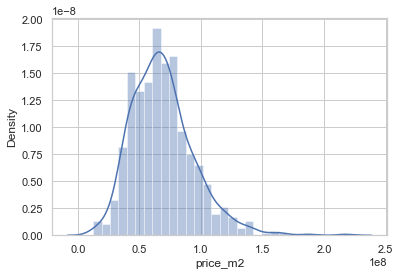

In [203]:
sns.distplot(datasets[datasets['area_name'] == 'Huyện Thanh Trì']['price_m2'])

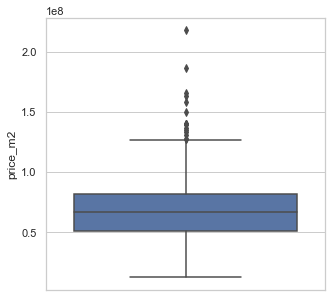

In [204]:
fig = plt.figure(figsize = (5,5))
sns.boxplot(y =datasets[datasets['area_name'] == 'Huyện Thanh Trì']['price_m2'])
plt.show()

In [205]:
with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
    display(datasets.query('area_name == "Huyện Thanh Trì" and price_m2 < 0.15e8')[['size', 'rooms', 'floors', 'house_type','price_string', 'price_m2', 'subject', 'body']])

,size,rooms,floors,house_type,price_string,price_m2,subject,body
5247,120.0,11.0,9.0,3.0,"1,6 tỷ",1.333333e+07,Cần bán nhà 9 tầng 46 phòng full nội thất,"Cần bán nhà Triều Khúc 9 tầng 46 phòng khép kín, full nội thất. Doanh thu 138 triệu 1 tháng. Khu vực đông sinh viên các trường Kiến Trúc, giao thông, Tổng hợp, y Tuệ Tĩnh. Phòng luôn kín khách. Vừa ở vừa khai thác cho thuê"
15627,72.0,2.0,NaN,3.0,900 triệu,1.250000e+07,Bán nhà 1 tầng gần chợ Đám Đại Áng Thanh Trì 72m,"Bán nhà trần 72m2, cách đường ôtô tránh 30m, ở Khánh hà gần chợ Đám Đại áng, Thanh Trì . GIÁ 900 triệu. LH - 0975.337.862 -"


In [206]:
datasets.drop([5247, 15627], inplace=True)

In [207]:
# with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
#     display(datasets.query('area_name == "Huyện Thanh Trì" and price_m2 > 1.5e8')[['size', 'rooms', 'floors', 'house_type','price_string', 'price_m2', 'subject', 'body']])

In [208]:
datasets.drop(datasets.query('area_name == "Huyện Thanh Trì" and price_m2 > 1.5e8').index, inplace=True)

In [209]:
px.scatter(datasets[datasets['area_name'] == 'Huyện Thanh Trì'], x='ward_name', y='price_m2')

In [210]:
datasets.drop(datasets.query('ward_name == "Xã Ngũ Hiệp" and price_m2 > 100e6').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Xã Tả Thanh Oai" and price_m2 > 100e6').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Xã Tân Triều" and price_m2 < 40e6').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Xã Vĩnh Quỳnh" and price_m2 > 100e6').index, inplace=True)

In [211]:
px.scatter(datasets[datasets['area_name'] == 'Huyện Thanh Trì'], x='ward_name', y='price')

In [212]:
datasets.drop(datasets.query('ward_name == "Xã Ngũ Hiệp" and price > 5e9').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Xã Tứ Hiệp" and price > 10e9').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Xã Tân Triều" and price > 20e9').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Thị trấn Văn Điển" and price > 10e9').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Xã Tam Hiệp" and price > 5e9').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Xã Huyện Thanh Trì" and price > 4e9').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Xã Huyện Vĩnh Quỳnh" and price > 7e9').index, inplace=True)

In [213]:
datasets[datasets['area_name'] == 'Huyện Thanh Trì']['ward_name'].value_counts()

Xã Tả Thanh Oai       120
Xã Tân Triều           91
Xã Thanh Liệt          75
Xã Tứ Hiệp             61
Thị trấn Văn Điển      56
Xã Tam Hiệp            47
Xã Vĩnh Quỳnh          46
Xã Ngọc Hồi            45
Xã Huyện Thanh Trì     31
Xã Liên Ninh           27
Xã Hữu Hoà             25
Xã Ngũ Hiệp            23
Name: ward_name, dtype: int64

In [214]:
px.scatter(datasets.query('area_name == "Huyện Thanh Trì"'), y='latitude', x='longitude', color='ward_name')

In [215]:
la_mean = datasets.query('area_name == "Huyện Thanh Trì" and latitude > 20.85 and latitude < 21.1')['latitude'].mean()

In [216]:
id = datasets.query('area_name == "Huyện Thanh Trì" and (latitude < 20.85 or latitude > 21.1)').index
datasets.loc[id, 'latitude'] = la_mean

In [217]:
lo_mean = datasets.query('area_name == "Huyện Thanh Trì" and longitude > 105.75 and longitude < 105.9')['longitude'].mean()

In [218]:
id = datasets.query('area_name == "Huyện Thanh Trì" and (longitude < 105.75 or longitude > 105.9)').index
datasets.loc[id, 'longitude'] = lo_mean

In [219]:
px.scatter(datasets.query('area_name == "Huyện Thanh Trì"'), y='latitude', x='longitude', color='ward_name')

##### **- Quận Ba Đình**

In [220]:
datasets[datasets['area_name'] == 'Quận Ba Đình']['ward_name'].value_counts()

Phường Đội Cấn              160
Phường Liễu Giai            132
Phường Cống Vị              122
Phường Vĩnh Phúc             87
Phường Ngọc Hà               76
Phường Kim Mã                69
Phường Ngọc Khánh            53
Phường Phúc Xá               39
Phường Thành Công            36
Phường Giảng Võ              31
Phường Quán Thánh            16
Phường Trúc Bạch             12
Phường Điện Biên             11
Phường Nguyễn Trung Trực      4
Name: ward_name, dtype: int64

In [221]:
temp = ['Phường Quán Thánh', 'Phường Trúc Bạch', 'Phường Điện Biên', 'Phường Nguyễn Trung Trực']
index = datasets.query('area_name == "Quận Ba Đình" and ward_name in @temp').index

datasets.loc[index, 'ward_name'] = 'Phường Quận Ba Đình'

In [222]:
datasets[datasets['area_name'] == 'Quận Ba Đình']['ward_name'].value_counts()

Phường Đội Cấn         160
Phường Liễu Giai       132
Phường Cống Vị         122
Phường Vĩnh Phúc        87
Phường Ngọc Hà          76
Phường Kim Mã           69
Phường Ngọc Khánh       53
Phường Quận Ba Đình     43
Phường Phúc Xá          39
Phường Thành Công       36
Phường Giảng Võ         31
Name: ward_name, dtype: int64

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='size', ylabel='Density'>

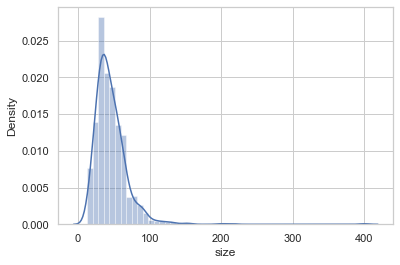

In [223]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Ba Đình']['size'])

In [224]:
with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
    display(datasets.query('area_name == "Quận Ba Đình" and size > 200')[['size', 'rooms', 'floors', 'price_string', 'ward_name', 'address', 'subject', 'body']])

,size,rooms,floors,price_string,ward_name,address,subject,body
8881,215.0,3.0,2.0,"17,291 tỷ",Phường Liễu Giai,Đường Đội Cấn,"Ba Đình – Liễu Giai 215m2, MT14m, ôtô tránh","+ Bán gấp nhà tại phường Liễu Giai, Ba Đình, Hà Nội. \n+ Diện tích 215m2, mặt tiền 14m2, chia 2 lô cực đẹp, Vị trí ngõ kinh doanh sầm uất, ôtô 7 chỗ đỗ cửa vào nhà thỏa mái. \n+ Hiện trạng là nhà 2 tầng cũ, Hai Mặt tiền, quý vị xác định mua đất xây tòa nhà 8 -9 tầng hoặc chia lô thành 2 căn vừa ở vừa kinh doanh cửa hàng, căn hộ hiệu suất dòng tiền cực cao. \n+ Khu vực trung tâm Ba Đình vài phút ra Lăng Bác, thuận tiện ra Hồ Tây, cơ sở hạ tầng điện đường trường trạm luôn trong TOP 1 của Thủ đô. \n+ Sổ đỏ chính chủ pháp lý sạch, mua bán nhanh gọn. \n+ Bán gấp 17.291 tỷ."
21899,400.0,4.0,NaN,36 tỷ,Phường Ngọc Hà,Đường Đội Cấn,Bán biệt thự khu Đội Cấn DT 400m2,"Bán biệt thự sân vườn, bể bơi phố Đội cấn, DT 400m2 biệt thự 3 tầng, giá bán 36 tỷ"


D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price', ylabel='Density'>

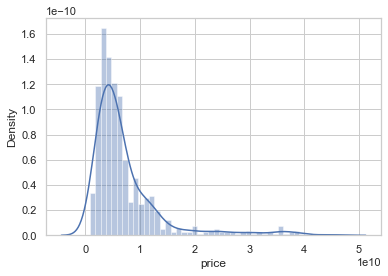

In [225]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Ba Đình']['price'])

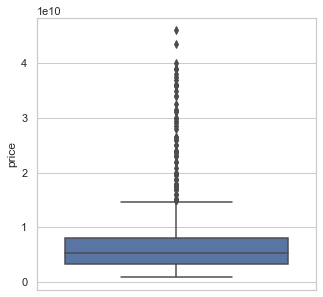

In [226]:
fig = plt.figure(figsize = (5,5))
sns.boxplot(y =datasets[datasets['area_name'] == 'Quận Ba Đình']['price'])
plt.show()

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price_m2', ylabel='Density'>

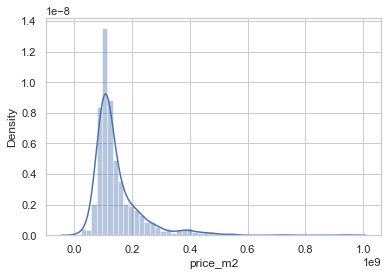

In [227]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Ba Đình']['price_m2'])

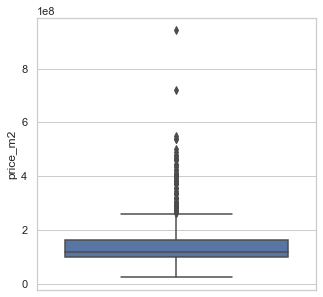

In [228]:
fig = plt.figure(figsize = (5,5))
sns.boxplot(y =datasets[datasets['area_name'] == 'Quận Ba Đình']['price_m2'])
plt.show()

In [229]:
px.scatter(datasets.query('area_name == "Quận Ba Đình"'), x='ward_name', y='price_m2')

In [230]:
datasets.drop(datasets.query('ward_name == "Phường Quận Ba Đình" and price_m2 > 0.6e9').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Ngọc Khánh" and price_m2 > 0.4e9').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Đội Cấn" and (price_m2 > 0.4e9 or price_m2 < 50e6)').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Kim Mã" and price_m2 > 0.3e9').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Ngọc Hà" and (price_m2 > 250e6 or price_m2 < 50e6)').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Thành Công" and price_m2 < 50e6').index, inplace=True)

In [231]:
px.scatter(datasets.query('area_name == "Quận Ba Đình"'), x='ward_name', y='price')

In [232]:
datasets.drop(datasets.query('ward_name == "Phường Giảng Võ" and price > 20e9').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Ngọc Khánh" and price > 15e9').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Ngọc Hà" and price > 19e9').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Thành Công" and price > 15e9').index, inplace=True)

In [233]:
px.scatter(datasets.query('area_name == "Quận Ba Đình"'), y='latitude', x='longitude', color='ward_name')

In [234]:
la_mean = datasets.query('area_name == "Quận Ba Đình" and latitude > 20.9 and latitude < 21.1')['latitude'].mean()

In [235]:
id = datasets.query('area_name == "Quận Ba Đình" and (latitude < 20.9 or latitude > 21.1)').index
datasets.loc[id, 'latitude'] = la_mean

In [236]:
lo_mean = datasets.query('area_name == "Quận Ba Đình" and longitude > 105.7 and longitude < 105.9')['longitude'].mean()

In [237]:
id = datasets.query('area_name == "Quận Ba Đình" and (longitude < 105.7 or longitude > 105.9)').index
datasets.loc[id, 'longitude'] = lo_mean

In [238]:
px.scatter(datasets.query('area_name == "Quận Ba Đình"'), y='latitude', x='longitude', color='ward_name', size='price_m2')

In [239]:
px.scatter(datasets.query('area_name == "Quận Ba Đình"'), y='latitude', x='longitude', color='ward_name', size='price')

##### **- Quận Bắc Từ Liêm**

In [240]:
datasets[datasets['area_name'] == 'Quận Bắc Từ Liêm']['ward_name'].value_counts()

Phường Xuân Đỉnh      256
Phường Phú Diễn       175
Phường Cổ Nhuế 1      116
Phường Cổ Nhuế 2       92
Phường Minh Khai       72
Phường Đông Ngạc       44
Phường Phúc Diễn       40
Phường Tây Tựu         23
Phường Thụy Phương     20
Phường Đức Thắng       14
Phường Liên Mạc        13
Phường Xuân Tảo        11
Phường Thượng Cát       1
Name: ward_name, dtype: int64

In [241]:
temp = ['Phường Đức Thắng', 'Phường Liên Mạc', 'Phường Xuân Tảo', 'Phường Thượng Cát']
index = datasets.query('area_name == "Quận Bắc Từ Liêm" and ward_name in @temp').index

datasets.loc[index, 'ward_name'] = 'Phường Quận Bắc Từ Liêm'

In [242]:
datasets[datasets['area_name'] == 'Quận Bắc Từ Liêm']['ward_name'].value_counts()

Phường Xuân Đỉnh           256
Phường Phú Diễn            175
Phường Cổ Nhuế 1           116
Phường Cổ Nhuế 2            92
Phường Minh Khai            72
Phường Đông Ngạc            44
Phường Phúc Diễn            40
Phường Quận Bắc Từ Liêm     39
Phường Tây Tựu              23
Phường Thụy Phương          20
Name: ward_name, dtype: int64

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='size', ylabel='Density'>

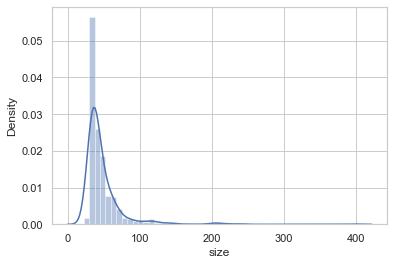

In [243]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Bắc Từ Liêm']['size'])

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price', ylabel='Density'>

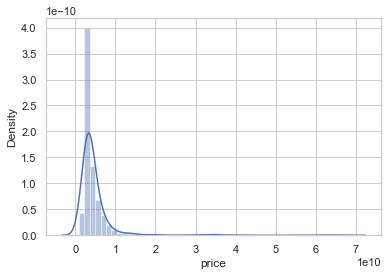

In [244]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Bắc Từ Liêm']['price'])

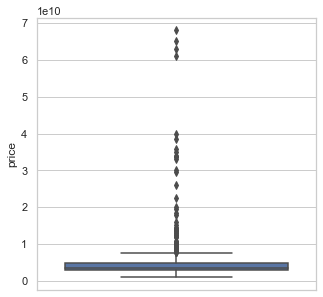

In [245]:
fig = plt.figure(figsize = (5,5))
sns.boxplot(y =datasets[datasets['area_name'] == 'Quận Bắc Từ Liêm']['price'])
plt.show()

In [246]:
with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
    display(datasets.query('area_name == "Quận Bắc Từ Liêm" and price > 5e10')[['size', 'rooms', 'floors', 'price_string', 'ward_name', 'address', 'subject', 'body']])

,size,rooms,floors,price_string,ward_name,address,subject,body
7898,240.0,5.0,3.0,65 tỷ,Phường Quận Bắc Từ Liêm,Đường Nguyễn Văn Huyên,Biệt Thự 240m Giá 65t Nguyễn Văn Huyên Bắc Từ Liêm,"++ BIỆT THỰ EMBASSY GADRDEN NGOẠI GIAO ĐOÀN NGUYỄN VĂN HUYÊN XUÂN ĐỈNH BẮC TỪ LIÊM, 240m2 MẶT TIỀN 13 GIÁ 65 TỶ. \n++ Biệt thự được xây dựng theo kiến trúc Pháp độc đáo đẳng cấp sang trọng, vị trí đắc địa nhất tại đại lộ phía tây Hà Nội, với đường mười làn xe chạy, kết nối với Đường Nguyễn Văn Huyên, Võ Chí Công, Phạm Văn Đồng, Hoàng Quốc Việt, tiện ích xung quanh 500m đến UBND phường Xuân La, Xuân Đỉnh, CV Ngoại Giao Đoàn,Đại Sứ Quán Hàn Quốc, kđT mới Starlake, nơi lý tưởng cho nhà đầu tư thông minh. \n\n++ Nhà thiết kế 3 tầng đầy đủ mọi tiêu chuẩn, tiện ích cho một căn biệt thự đẳng cấp xa hoa giữa lòng Hà Nội. \n++ Giá 65 tỷ, gặp trực tiếp chính chủ thương lượng. \n++ Sổ đỏ đã được cấp chính chủ vuông vắn. \n++ Liên hệ chuyên gia tư vấn Môi Giới bất động sản để có được thông tin chính xác nhất; . \n++ Không qua trung gian. \n++ Uy Tín, Chuyên Nghiệp Trung Thực, Tin Cậy, Bảo Mật."
13860,400.0,5.0,5.0,68 tỷ,Phường Cổ Nhuế 1,Đường Phạm Văn Đồng,Biệt Thự Nam Cường Bắc Từ Liêm 400m2 Giá 68 Tỷ,"++ BÁN BIỆT THỰ NAM CƯỜNG TÔN QUANG PHIỆT - BẮC TỪ LIÊM - 400M2 GIÁ 68 TỶ - MẶT TIỀN 20M - 2 THOÁNG. \n\n++ Thiết kế 5 tầng theo kiến trúc độc đáo của ITALI, hội tụ đầy đủ mọi tiêu trí chuẩn của Âu Châu, làm hài lòng tất cả khách thượng lưu khó tính, nội thất cao cấp nhập khẩu từ Italia, mang đến vẻ đẹp sang trọng hài hòa lý tưởng.\n++ Giao thông kết nối với Đường Phạm Văn Đồng,Hoàng Quốc Việt, Thành Phố Giao Lưu, siêu thị Metro markit, trường học liên cấp NewTon, Pastcan. \n\n++ Giá 68 tỷ gặp trực tiếp có thương lượng. \n++ Sổ đỏ đã được cấp. \n++ Liên hệ; , chuyên gia tư vấn Môi Giới bất động sản, có thêm thông tin chi tiết. \n++ Không qua trung gian."
17609,197.0,3.0,NaN,63 tỷ,Phường Cổ Nhuế 1,Đường Phạm Văn Đồng,BIỆT THỰ THÀNH PHỐ GIAO LƯU - VIEW HỒ. VỊ TRÍ VIP,"BIỆT THỰ THÀNH PHỐ GIAO LƯU - VIEW HỒ. ĐẲNG CẤP THƯỢNG LƯU\n\n\n- Diện tích : 197m2\n- Diện tích xây dựng: 130m2\n- Số tầng: 4 tầng\n- Mặt tiền 10m\n\n- Khu đô thị Thành Phố Giao Lưu là tổ hợp Biệt thự, liền kề, chung cư vô cùng đẳng cấp nằm ngay phía sau của Bộ Công An 47 Phạm Văn Đồng. Đường xá, cây xanh, hồ nước như một đất nước Singapore thu nhỏ giữa lòng thủ đô.\n\n- Trong khu đô thị chỉ có gần 100 căn biệt thự, các lãnh đạo cao cấp ở đây rất nhiều. Khu vực có tổ hợp chung cư An Bình, Green Star, Thái Hà, sát Bộ Công An, an sinh hay kinh doanh đều đỉnh cao.\n\n- Nhà sát ngay bờ hồ, đường đẹp , trung tâm trong khu đô thị thuộc sở hữu của một quan chức cực kỳ cao cấp trong Bộ Công An. Toàn bộ dãy biệt thự ở bờ hồ đều kinh doanh cafe, nhà hàng vô cùng đắt khách.\n\n- Nhà hoàn thiện với trang thiết bị nhập ngoại, nội thất đắt đỏ, khách mua chỉ mang quần áo về ở.\nKhu đô thị có vô vàn tiện ích.\n• Công viên sinh thái, hồ điều hòa rộng 15 ha.\n• Tuyến phố thương mại với hàng trăm. thương hiệu uy tín.\n• Trường mầm non đạt chuẩn quốc gia.Thiết kế nội thất đỉnh cao.\n• 02 bể bơi ngoài trời rộng 1200 m2 \n• Các công trình tiện ích đẳng cấp: Quảng trường các vị thần, quảng trường nhạc nước, quảng trường mùa hạ, vườn treo…\n• Các khu nướng BBQ, tập Yoga, y tế, khu dưỡng sinh, chơi cờ dành cho người già, trẻ em, hệ thống phòng tập GYM & SPA, siêu thị, trung tâm thương mại, hệ thống nhà hàng.\n\nGiá 63 tỷ\nLiên hệ em Mạnh để mua nhà"
22299,220.0,5.0,NaN,61 tỷ,Phường Xuân Đỉnh,Đường Nguyễn Văn Huyên,Biệt thự Starlake DeaWoo Tây Hồ Tây,"Dự án: KĐT Starlake Deawoo Tây Hồ Tây.\n Thông tin chi tiết: Chính chủ cần bán Biệt thự Starlake Deawoo Tây Hồ Tây \n+ DT 220m2 \n+ DTXD 80m2*3.5 tầng.\nKhu K3 quần thể nõi Trung tâm của KĐT Starlake Deawoo \n+ Giá 61ty( bao phí sang tên)\nFull tiện ích và quần thể của 1 KĐT đáng sống tại Hà nội\n+ Đã nhận nhà và sổ đỏ rõ ràng, pháp lý minh bạch\nKhu dân cư vip, đẳng cấp, an ninh an toàn 3 lơp, dân trí cao.\nLiên hệ đi xem BIệt thự\nHotline: 0987 134 377"


D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price_m2', ylabel='Density'>

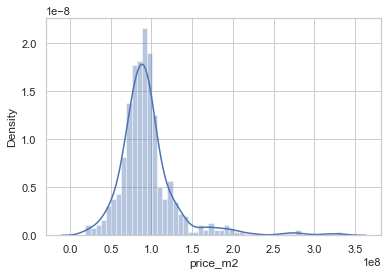

In [247]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Bắc Từ Liêm']['price_m2'])

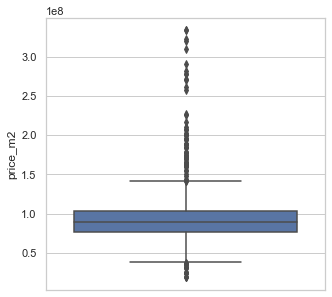

In [248]:
fig = plt.figure(figsize = (5,5))
sns.boxplot(y =datasets[datasets['area_name'] == 'Quận Bắc Từ Liêm']['price_m2'])
plt.show()

In [243]:
px.scatter(datasets.query('area_name == "Quận Bắc Từ Liêm"'), x='ward_name', y='price_m2')

In [244]:
datasets.drop(datasets.query('area_name == "Quận Bắc Từ Liêm" and ward_name == "Phường Phú Diễn" and price_m2 > 250e6').index, inplace=True)
datasets.drop(datasets.query('area_name == "Quận Bắc Từ Liêm" and ward_name == "Phường Xuân Đỉnh" and price_m2 > 250e6').index, inplace=True)
datasets.drop(datasets.query('area_name == "Quận Bắc Từ Liêm" and ward_name == "Phường Quận Bắc Từ Liêm" and price_m2 > 150e6').index, inplace=True)
datasets.drop(datasets.query('area_name == "Quận Bắc Từ Liêm" and ward_name == "Phường Phúc Diễn" and price_m2 > 0.15e9').index, inplace=True)
datasets.drop(datasets.query('area_name == "Quận Bắc Từ Liêm" and ward_name == "Phường Minh Khai" and (price_m2 > 150e6 or price_m2 < 40e6)').index, inplace=True)
datasets.drop(datasets.query('area_name == "Quận Bắc Từ Liêm" and ward_name == "Phường Cổ Nhuế 2" and (price_m2 < 50e6 or price_m2 > 150e6)').index, inplace=True)

In [245]:
px.scatter(datasets.query('area_name == "Quận Bắc Từ Liêm"'), x='ward_name', y='price')

In [246]:
datasets.drop(datasets.query('area_name == "Quận Bắc Từ Liêm" and ward_name == "Phường Phú Diễn" and price > 20e9').index, inplace=True)
datasets.drop(datasets.query('area_name == "Quận Bắc Từ Liêm" and ward_name == "Phường Xuân Đỉnh" and price > 20e9').index, inplace=True)
datasets.drop(datasets.query('area_name == "Quận Bắc Từ Liêm" and ward_name == "Phường Quận Bắc Từ Liêm" and price > 20e9').index, inplace=True)
datasets.drop(datasets.query('area_name == "Quận Bắc Từ Liêm" and ward_name == "Phường Cổ Nhuế 2" and price > 20e9').index, inplace=True)

In [247]:
px.scatter(datasets.query('area_name == "Quận Bắc Từ Liêm"'), y='latitude', x='longitude', color='ward_name')

In [249]:
la_mean = datasets.query('area_name == "Quận Bắc Từ Liêm" and latitude > 20.95 and latitude < 21.2')['latitude'].mean()

In [250]:
id = datasets.query('area_name == "Quận Bắc Từ Liêm" and (latitude < 20.95 or latitude > 21.2)').index
datasets.loc[id, 'latitude'] = la_mean

In [251]:
lo_mean = datasets.query('area_name == "Quận Bắc Từ Liêm" and longitude > 105.7 and longitude < 105.9')['longitude'].mean()

In [252]:
id = datasets.query('area_name == "Quận Bắc Từ Liêm" and (longitude < 105.7 or longitude > 105.9)').index
datasets.loc[id, 'longitude'] = lo_mean

In [253]:
px.scatter(datasets.query('area_name == "Quận Bắc Từ Liêm"'), y='latitude', x='longitude', color='ward_name', size='price_m2')

##### **- Quận Tây Hồ**

In [253]:
datasets[datasets['area_name'] == 'Quận Tây Hồ']['ward_name'].value_counts()

Phường Xuân La       269
Phường Bưởi          227
Phường Thụy Khuê     186
Phường Nhật Tân       69
Phường Yên Phụ        68
Phường Quảng An       63
Phường Phú Thượng     63
Phường Tứ Liên        60
Name: ward_name, dtype: int64

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='size', ylabel='Density'>

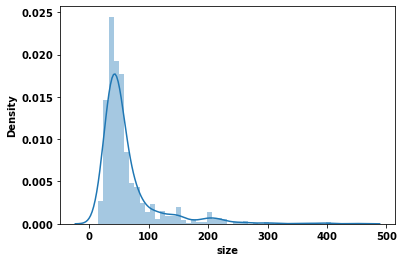

In [254]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Tây Hồ']['size'])

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price', ylabel='Density'>

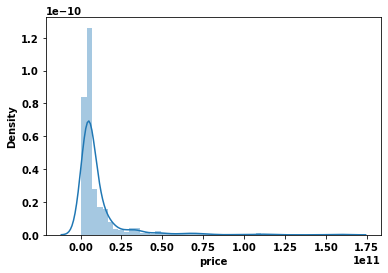

In [255]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Tây Hồ']['price'])

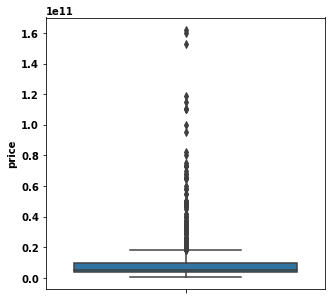

In [256]:
fig = plt.figure(figsize = (5,5))
sns.boxplot(y =datasets[datasets['area_name'] == 'Quận Tây Hồ']['price'])
plt.show()

In [257]:
# with pd.option_context('display.max_colwidth', None, 'display.max_row', None,):
#     display(datasets.query('area_name == "Quận Tây Hồ" and price > 6e10')[['size', 'rooms', 'floors', 'price_string', 'ward_name', 'address', 'subject', 'body']])

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price_m2', ylabel='Density'>

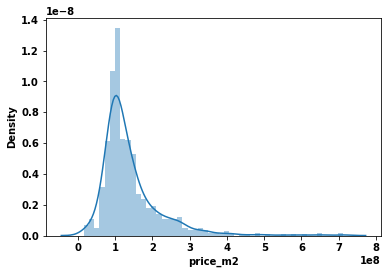

In [258]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Tây Hồ']['price_m2'])

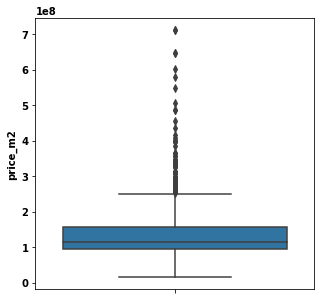

In [259]:
fig = plt.figure(figsize = (5,5))
sns.boxplot(y =datasets[datasets['area_name'] == 'Quận Tây Hồ']['price_m2'])
plt.show()

In [260]:
px.scatter(datasets.query('area_name == "Quận Tây Hồ"'), x='ward_name', y='price_m2')

In [261]:
datasets.drop(datasets.query('area_name == "Quận Tây Hồ" and ward_name == "Phường Xuân La" and price_m2 > 0.5e9').index, inplace=True)
datasets.drop(datasets.query('area_name == "Quận Tây Hồ" and ward_name == "Phường Thụy Khuê" and price_m2 > 0.6e9').index, inplace=True)
datasets.drop(datasets.query('area_name == "Quận Tây Hồ" and ward_name == "Phường Tứ Liên" and price_m2 > 0.6e9').index, inplace=True)


In [262]:
px.scatter(datasets.query('area_name == "Quận Tây Hồ"'), x='ward_name', y='price')

In [263]:
px.scatter(datasets.query('area_name == "Quận Tây Hồ"'), y='latitude', x='longitude', color='ward_name')

In [264]:
la_mean = datasets.query('area_name == "Quận Tây Hồ" and latitude > 21 and latitude < 21.1')['latitude'].mean()

In [265]:
id = datasets.query('area_name == "Quận Tây Hồ" and (latitude < 21 or latitude > 21.1)').index
datasets.loc[id, 'latitude'] = la_mean

In [266]:
lo_mean = datasets.query('area_name == "Quận Tây Hồ" and longitude > 105.7 and longitude < 105.9')['longitude'].mean()

In [267]:
id = datasets.query('area_name == "Quận Tây Hồ" and (longitude < 105.7 or longitude > 105.9)').index
datasets.loc[id, 'longitude'] = lo_mean

In [268]:
px.scatter(datasets.query('area_name == "Quận Tây Hồ"'), y='latitude', x='longitude', color='ward_name', size='price_m2')

In [269]:
px.scatter(datasets.query('area_name == "Quận Tây Hồ"'), y='latitude', x='longitude', color='ward_name', size='price')

##### **- Quận Nam Từ Liêm**

In [270]:
datasets[datasets['area_name'] == 'Quận Nam Từ Liêm']['ward_name'].value_counts()

Phường Mỹ Đình 1      422
Phường Mỹ Đình 2      228
Phường Mễ Trì         112
Phường Phú Đô         105
Phường Đại Mỗ          98
Phường Tây Mỗ          87
Phường Trung Văn       81
Phường Cầu Diễn        62
Phường Xuân Phương     54
Phường Phương Canh     50
Name: ward_name, dtype: int64

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='size', ylabel='Density'>

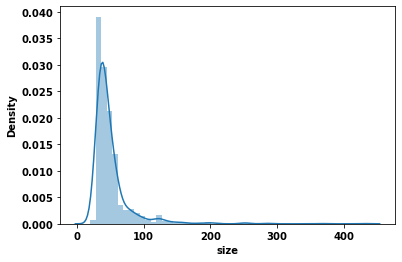

In [271]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Nam Từ Liêm']['size'])

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price', ylabel='Density'>

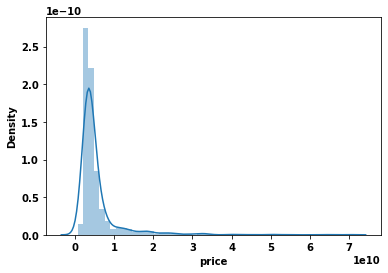

In [272]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Nam Từ Liêm']['price'])

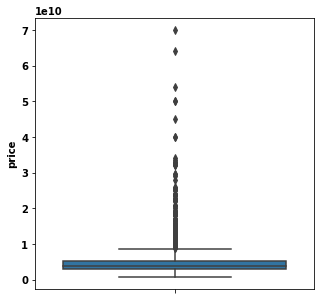

In [273]:
fig = plt.figure(figsize = (5,5))
sns.boxplot(y =datasets[datasets['area_name'] == 'Quận Nam Từ Liêm']['price'])
plt.show()

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price_m2', ylabel='Density'>

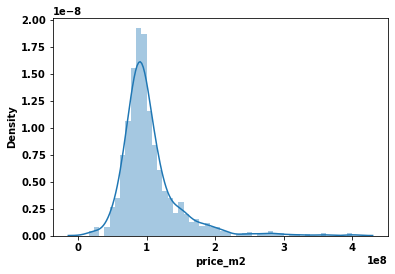

In [274]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Nam Từ Liêm']['price_m2'])

In [275]:
px.scatter(datasets.query('area_name == "Quận Nam Từ Liêm"'), y='latitude', x='longitude', color='ward_name')

In [276]:
la_mean = datasets.query('area_name == "Quận Nam Từ Liêm" and latitude > 20.9 and latitude < 21.2')['latitude'].mean()

In [277]:
id = datasets.query('area_name == "Quận Nam Từ Liêm" and (latitude < 20.9 or latitude > 21.2)').index
datasets.loc[id, 'latitude'] = la_mean

In [278]:
lo_mean = datasets.query('area_name == "Quận Nam Từ Liêm" and longitude > 105.7 and longitude < 105.9')['longitude'].mean()

In [279]:
id = datasets.query('area_name == "Quận Nam Từ Liêm" and (longitude < 105.7 or longitude > 105.9)').index
datasets.loc[id, 'longitude'] = lo_mean

In [280]:
px.scatter(datasets.query('area_name == "Quận Nam Từ Liêm"'), y='latitude', x='longitude', color='ward_name',size='price_m2')

In [281]:
px.scatter(datasets.query('area_name == "Quận Nam Từ Liêm"'), y='latitude', x='longitude', color='ward_name',size='price')

In [282]:
px.scatter(datasets.query('area_name == "Quận Nam Từ Liêm"'), x='ward_name', y='price_m2')

In [283]:
datasets.drop(datasets.query('ward_name == "Phường Mỹ Đình 2" and price_m2 < 50e6').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Trung Văn" and price_m2 < 50e6').index, inplace=True)

In [284]:
px.scatter(datasets.query('area_name == "Quận Nam Từ Liêm"'), x='ward_name', y='price')

##### **- Quận Hai Bà Trưng**

In [285]:
datasets[datasets['area_name'] == 'Quận Hai Bà Trưng']['ward_name'].value_counts()

Phường Minh Khai       286
Phường Bạch Mai        203
Phường Thanh Nhàn      155
Phường Trương Định     146
Phường Vĩnh Tuy        136
Phường Thanh Lương     133
Phường Đồng Tâm        105
Phường Bách Khoa        75
Phường Bạch Đằng        39
Phường Đống Mác         37
Phường Quỳnh Lôi        36
Phường Cầu Dền          35
Phường Quỳnh Mai        28
Phường Lê Đại Hành      28
Phường Phố Huế          20
Phường Phạm Đình Hổ     16
Phường Đồng Nhân        16
Phường Nguyễn Du         8
Phường Bùi Thị Xuân      8
Phường Ngô Thì Nhậm      8
Name: ward_name, dtype: int64

In [286]:
temp = ['Phường Ngô Thì Nhậm', 'Phường Bùi Thị Xuân', 'Phường Nguyễn Du']
index = datasets.query('area_name == "Quận Hai Bà Trưng" and ward_name in @temp').index

datasets.loc[index, 'ward_name'] = 'Phường Quận Hai Bà Trưng'

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='size', ylabel='Density'>

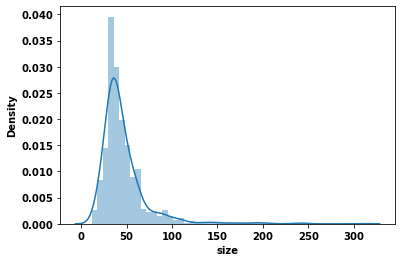

In [287]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Hai Bà Trưng']['size'])

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price', ylabel='Density'>

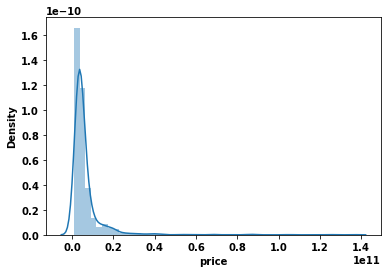

In [288]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Hai Bà Trưng']['price'])

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price_m2', ylabel='Density'>

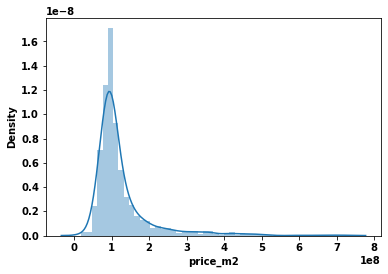

In [289]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Hai Bà Trưng']['price_m2'])

In [290]:
px.scatter(datasets.query('area_name == "Quận Hai Bà Trưng"'), y='latitude', x='longitude', color='ward_name')

In [291]:
la_mean = datasets.query('area_name == "Quận Hai Bà Trưng" and latitude > 20.9 and latitude < 21.2')['latitude'].mean()

In [292]:
id = datasets.query('area_name == "Quận Hai Bà Trưng" and (latitude < 20.9 or latitude > 21.2)').index
datasets.loc[id, 'latitude'] = la_mean

In [293]:
lo_mean = datasets.query('area_name == "Quận Hai Bà Trưng" and longitude > 105.6 and longitude < 106')['longitude'].mean()

In [294]:
id = datasets.query('area_name == "Quận Hai Bà Trưng" and (longitude < 105.6 or longitude > 106)').index
datasets.loc[id, 'longitude'] = lo_mean

In [295]:
px.scatter(datasets.query('area_name == "Quận Hai Bà Trưng"'), y='latitude', x='longitude', color='ward_name',size='price_m2')

In [296]:
px.scatter(datasets.query('area_name == "Quận Hai Bà Trưng"'), y='latitude', x='longitude', color='ward_name',size='price')

In [297]:
px.scatter(datasets.query('area_name == "Quận Hai Bà Trưng"'), x='ward_name', y='price_m2')

In [298]:
datasets.drop(datasets.query('ward_name == "Phường Thanh Nhàn" and price_m2 < 50e6').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Minh Khai" and price_m2 < 50e6').index, inplace=True)
datasets.drop(datasets.query('area_name == "Quận Hai Bà Trưng" and price_m2 > 600e6').index, inplace=True)

In [299]:
px.scatter(datasets.query('area_name == "Quận Hai Bà Trưng"'), x='ward_name', y='price')

##### **- Quận Đống Đa**

In [300]:
datasets[datasets['area_name'] == 'Quận Đống Đa']['ward_name'].value_counts()

Phường Láng Hạ          278
Phường Ô Chợ Dừa        227
Phường Trung Liệt       223
Phường Láng Thượng      174
Phường Thịnh Quang      145
Phường Khương Thượng    138
Phường Ngã Tư Sở        128
Phường Hàng Bột         119
Phường Khâm Thiên        90
Phường Quang Trung       67
Phường Cát Linh          65
Phường Nam Đồng          64
Phường Phương Mai        62
Phường Thổ Quan          48
Phường Kim Liên          48
Phường Trung Phụng       45
Phường Văn Chương        43
Phường Trung Tự          42
Phường Phương Liên       37
Phường Quốc Tử Giám      37
Phường Văn Miếu          29
Name: ward_name, dtype: int64

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='size', ylabel='Density'>

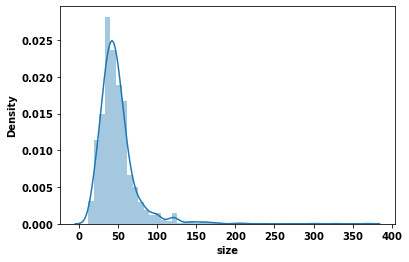

In [301]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Đống Đa']['size'])

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price', ylabel='Density'>

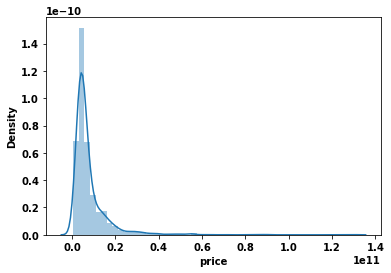

In [302]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Đống Đa']['price'])

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price_m2', ylabel='Density'>

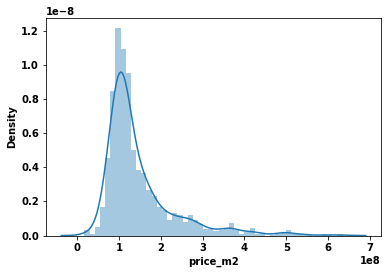

In [303]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Đống Đa']['price_m2'])

In [304]:
px.scatter(datasets.query('area_name == "Quận Đống Đa"'), y='latitude', x='longitude', color='ward_name')

In [305]:
la_mean = datasets.query('area_name == "Quận Đống Đa" and latitude > 20.9 and latitude < 21.05')['latitude'].mean()

In [306]:
id = datasets.query('area_name == "Quận Đống Đa" and (latitude < 20.9 or latitude > 21.05)').index
datasets.loc[id, 'latitude'] = la_mean

In [307]:
lo_mean = datasets.query('area_name == "Quận Đống Đa" and longitude > 105.79 and longitude < 105.9')['longitude'].mean()

In [308]:
id = datasets.query('area_name == "Quận Đống Đa" and (longitude < 105.79 or longitude > 105.9)').index
datasets.loc[id, 'longitude'] = lo_mean

In [309]:
px.scatter(datasets.query('area_name == "Quận Đống Đa"'), y='latitude', x='longitude', color='ward_name',size='price_m2')

In [310]:
px.scatter(datasets.query('area_name == "Quận Đống Đa"'), y='latitude', x='longitude', color='ward_name',size='price')

In [311]:
px.scatter(datasets.query('area_name == "Quận Đống Đa"'), x='ward_name', y='price_m2')

In [312]:
datasets.drop(datasets.query('area_name == "Quận Đống Đa" and price_m2 < 30e6').index, inplace=True)

In [313]:
px.scatter(datasets.query('area_name == "Quận Đống Đa"'), x='ward_name', y='price')

In [314]:
datasets.drop(datasets.query('area_name == "Quận Đống Đa" and price > 100e9').index, inplace=True)

##### **- Quận Thanh Xuân**

In [315]:
datasets[datasets['area_name'] == 'Quận Thanh Xuân']['ward_name'].value_counts()

Phường Khương Đình         409
Phường Nhân Chính          403
Phường Khương Trung        392
Phường Khương Mai          275
Phường Thanh Xuân Bắc      128
Phường Thanh Xuân Nam      125
Phường Thanh Xuân Trung    112
Phường Phương Liệt         108
Phường Thượng Đình         105
Phường Hạ Đình              79
Phường Kim Giang            78
Name: ward_name, dtype: int64

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='size', ylabel='Density'>

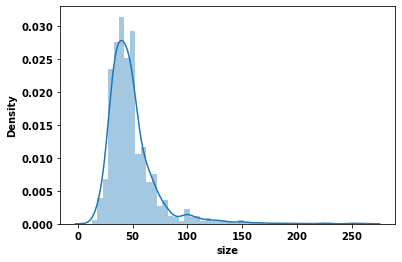

In [316]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Thanh Xuân']['size'])

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price', ylabel='Density'>

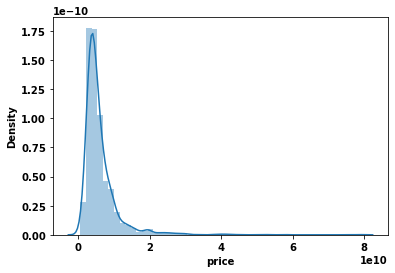

In [317]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Thanh Xuân']['price'])

D:\Users\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='price_m2', ylabel='Density'>

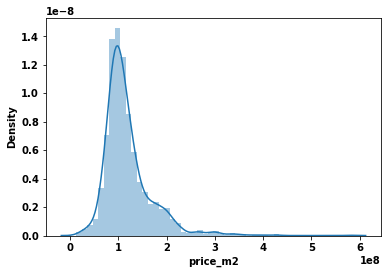

In [318]:
sns.distplot(datasets[datasets['area_name'] == 'Quận Thanh Xuân']['price_m2'])

In [319]:
px.scatter(datasets.query('area_name == "Quận Thanh Xuân"'), y='latitude', x='longitude', color='ward_name')

In [320]:
la_mean = datasets.query('area_name == "Quận Thanh Xuân" and latitude > 20.9 and latitude < 21')['latitude'].mean()

In [321]:
id = datasets.query('area_name == "Quận Thanh Xuân" and (latitude < 20.9 or latitude > 21)').index
datasets.loc[id, 'latitude'] = la_mean

In [322]:
lo_mean = datasets.query('area_name == "Quận Thanh Xuân" and longitude > 105.7 and longitude < 105.9')['longitude'].mean()

In [323]:
id = datasets.query('area_name == "Quận Thanh Xuân" and (longitude < 105.7 or longitude > 105.9)').index
datasets.loc[id, 'longitude'] = lo_mean

In [324]:
px.scatter(datasets.query('area_name == "Quận Thanh Xuân"'), y='latitude', x='longitude', color='ward_name',size='price_m2')

In [325]:
px.scatter(datasets.query('area_name == "Quận Thanh Xuân"'), y='latitude', x='longitude', color='ward_name',size='price')

In [326]:
px.scatter(datasets.query('area_name == "Quận Thanh Xuân"'), x='ward_name', y='price_m2')

In [327]:
datasets.drop(datasets.query('ward_name == "Phường Khương Mai" and price_m2 < 50e6').index, inplace=True)

In [328]:
px.scatter(datasets.query('area_name == "Quận Thanh Xuân"'), x='ward_name', y='price')

In [329]:
datasets.drop(datasets.query('area_name == "Quận Thanh Xuân" and price > 60e9').index, inplace=True)

##### **- Quận Long Biên**

In [330]:
datasets[datasets['area_name'] == 'Quận Long Biên']['ward_name'].value_counts()

Phường Bồ Đề           425
Phường Long Biên       328
Phường Thạch Bàn       264
Phường Ngọc Thụy       247
Phường Ngọc Lâm        201
Phường Việt Hưng       142
Phường Gia Thụy        139
Phường Sài Đồng         90
Phường Phúc Lợi         86
Phường Thượng Thanh     85
Phường Cự Khối          80
Phường Đức Giang        66
Phường Phúc Đồng        54
Phường Giang Biên       21
Name: ward_name, dtype: int64

In [331]:
px.scatter(datasets.query('area_name == "Quận Long Biên"'), y='latitude', x='longitude', color='ward_name')

In [332]:
la_mean = datasets.query('area_name == "Quận Long Biên" and latitude > 20.9 and latitude < 21.1')['latitude'].mean()

In [333]:
id = datasets.query('area_name == "Quận Long Biên" and (latitude < 20.9 or latitude > 21.1)').index
datasets.loc[id, 'latitude'] = la_mean

In [334]:
lo_mean = datasets.query('area_name == "Quận Long Biên" and longitude > 105.7 and longitude < 106')['longitude'].mean()

In [335]:
id = datasets.query('area_name == "Quận Long Biên" and (longitude < 105.7 or longitude > 106)').index
datasets.loc[id, 'longitude'] = lo_mean

In [336]:
px.scatter(datasets.query('area_name == "Quận Long Biên"'), y='latitude', x='longitude', color='ward_name',size='price_m2')

In [337]:
px.scatter(datasets.query('area_name == "Quận Long Biên"'), y='latitude', x='longitude', color='ward_name',size='price')

In [338]:
px.scatter(datasets.query('area_name == "Quận Long Biên"'), x='ward_name', y='price_m2')

In [339]:
datasets.drop(datasets.query('ward_name == "Phường Gia Thụy" and price_m2 < 30e6').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Đức Giang" and price_m2 < 30e6').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Ngọc Thụy" and price_m2 > 200e6').index, inplace=True)

In [340]:
px.scatter(datasets.query('area_name == "Quận Long Biên"'), x='ward_name', y='price')

##### **- Quận Cầu Giấy**

In [341]:
datasets[datasets['area_name'] == 'Quận Cầu Giấy']['ward_name'].value_counts()

Phường Nghĩa Đô         390
Phường Quan Hoa         389
Phường Yên Hoà          369
Phường Trung Hoà        326
Phường Mai Dịch         270
Phường Dịch Vọng Hậu    254
Phường Dịch Vọng        244
Phường Nghĩa Tân        146
Name: ward_name, dtype: int64

In [342]:
px.scatter(datasets.query('area_name == "Quận Cầu Giấy"'), y='latitude', x='longitude', color='ward_name')

In [343]:
la_mean = datasets.query('area_name == "Quận Cầu Giấy" and latitude > 20.95 and latitude < 21.1')['latitude'].mean()

In [344]:
id = datasets.query('area_name == "Quận Cầu Giấy" and (latitude < 20.95 or latitude > 21.1)').index
datasets.loc[id, 'latitude'] = la_mean

In [345]:
lo_mean = datasets.query('area_name == "Quận Cầu Giấy" and longitude > 105.75 and longitude < 105.9')['longitude'].mean()

In [346]:
id = datasets.query('area_name == "Quận Cầu Giấy" and (longitude < 105.75 or longitude > 105.9)').index
datasets.loc[id, 'longitude'] = lo_mean

In [347]:
px.scatter(datasets.query('area_name == "Quận Cầu Giấy"'), y='latitude', x='longitude', color='ward_name',size='price_m2')

In [348]:
px.scatter(datasets.query('area_name == "Quận Cầu Giấy"'), y='latitude', x='longitude', color='ward_name',size='price')

In [349]:
px.scatter(datasets.query('area_name == "Quận Cầu Giấy"'), x='ward_name', y='price_m2')

In [350]:
datasets.drop(datasets.query('ward_name == "Phường Dịch Vọng" and (price_m2 < 30e6 or price_m2 > 0.8e9)').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Mai Dịch" and price_m2 < 50e6').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Quan Hoa" and price_m2 > 500e6').index, inplace=True)

In [351]:
px.scatter(datasets.query('area_name == "Quận Cầu Giấy"'), x='ward_name', y='price')

In [352]:
datasets.drop(datasets.query('ward_name == "Phường Trung Hòa" and price > 80e9').index, inplace=True)

##### **- Quận Hoàng Mai** 

In [353]:
datasets[datasets['area_name'] == 'Quận Hoàng Mai']['ward_name'].value_counts()

Phường Hoàng Văn Thụ    272
Phường Lĩnh Nam         257
Phường Tân Mai          248
Phường Đại Kim          248
Phường Hoàng Liệt       226
Phường Định Công        218
Phường Vĩnh Hưng        205
Phường Giáp Bát         183
Phường Thịnh Liệt       165
Phường Tương Mai        145
Phường Mai Động          88
Phường Thanh Trì         84
Phường Yên Sở            65
Phường Trần Phú           7
Name: ward_name, dtype: int64

In [354]:
px.scatter(datasets.query('area_name == "Quận Hoàng Mai"'), y='latitude', x='longitude', color='ward_name')

In [355]:
la_mean = datasets.query('area_name == "Quận Hoàng Mai" and latitude > 20.9 and latitude < 21.1')['latitude'].mean()

In [356]:
id = datasets.query('area_name == "Quận Hoàng Mai" and (latitude < 20.9 or latitude > 21.1)').index
datasets.loc[id, 'latitude'] = la_mean

In [357]:
px.scatter(datasets.query('area_name == "Quận Long Biên"'), y='latitude', x='longitude', color='ward_name',size='price_m2')

In [358]:
px.scatter(datasets.query('area_name == "Quận Hoàng Mai"'), y='latitude', x='longitude', color='ward_name',size='price')

In [359]:
px.scatter(datasets.query('area_name == "Quận Hoàng Mai"'), x='ward_name', y='price_m2')

In [360]:
datasets.drop(datasets.query('ward_name == "Phường Giáp Bát" and price_m2 < 30e6').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Yên Sở" and price_m2 < 30e6').index, inplace=True)

In [361]:
px.scatter(datasets.query('area_name == "Quận Hoàng Mai"'), x='ward_name', y='price')

In [362]:
datasets.drop(datasets.query('area_name == "Quận Hoàng Mai" and price >= 50e9').index, inplace=True)

##### **- Quận Hà Đông**

In [363]:
datasets[datasets['area_name'] == 'Quận Hà Đông']['ward_name'].value_counts()

Phường Yên Nghĩa      357
Phường La Khê         253
Phường Văn Quán       230
Phường Quang Trung    222
Phường Kiến Hưng      218
Phường Vạn Phúc       201
Phường Hà Cầu         178
Phường Dương Nội      170
Phường Mộ Lao         159
Phường Phú Lãm        132
Phường Nguyễn Trãi    126
Phường Phú La          94
Phường Phúc La         90
Phường Phú Lương       59
Phường Đồng Mai        25
Phường Biên Giang      21
Phường Yết Kiêu        16
Name: ward_name, dtype: int64

In [364]:
px.scatter(datasets.query('area_name == "Quận Hà Đông"'), y='latitude', x='longitude', color='ward_name')

In [365]:
la_mean = datasets.query('area_name == "Quận Hà Đông" and latitude > 20.8 and latitude < 21.2')['latitude'].mean()

In [366]:
id = datasets.query('area_name == "Quận Hà Đông" and (latitude < 20.8 or latitude > 21.2)').index
datasets.loc[id, 'latitude'] = la_mean

In [367]:
lo_mean = datasets.query('area_name == "Quận Hà Đông" and longitude > 105.6 and longitude < 105.9')['longitude'].mean()

In [368]:
id = datasets.query('area_name == "Quận Hà Đông" and (longitude < 105.6 or longitude > 105.9)').index
datasets.loc[id, 'longitude'] = lo_mean

In [369]:
px.scatter(datasets.query('area_name == "Quận Hà Đông"'), y='latitude', x='longitude', color='ward_name',size='price_m2')

In [370]:
px.scatter(datasets.query('area_name == "Quận Hà Đông"'), y='latitude', x='longitude', color='ward_name',size='price')

In [371]:
px.scatter(datasets.query('area_name == "Quận Hà Đông"'), x='ward_name', y='price_m2')

In [372]:
datasets.drop(datasets.query('ward_name == "Phường La Khê" and (price_m2 > 600e6 or price_m2 < 50e6)').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Nguyễn Trãi" and price_m2 < 50e6').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Phú La" and price_m2 < 50e6').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Mộ Lao" and price_m2 > 250e6').index, inplace=True)
datasets.drop(datasets.query('ward_name == "Phường Yên Nghĩa" and price_m2 > 250e6').index, inplace=True)

In [373]:
px.scatter(datasets.query('area_name == "Quận Hà Đông"'), x='ward_name', y='price')

In [374]:
datasets.drop(datasets.query('area_name == "Quận Hà Đông" and price > 35e9').index, inplace=True)

### **4. Data cleaning and drop column**

In [375]:
datasets.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20427 entries, 1 to 22307
Data columns (total 36 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   list_time                20427 non-null  object 
 1   subject                  20427 non-null  object 
 2   body                     20427 non-null  object 
 3   area                     20427 non-null  int64  
 4   area_name                20427 non-null  object 
 5   region                   20427 non-null  int64  
 6   price                    20427 non-null  int64  
 7   price_string             20427 non-null  object 
 8   rooms                    20427 non-null  float64
 9   property_legal_document  16718 non-null  float64
 10  property_road_condition  5555 non-null   float64
 11  property_back_condition  5272 non-null   float64
 12  size                     20427 non-null  float64
 13  region_v2                20427 non-null  int64  
 14  area_v2               

In [376]:
datasets.area_name.unique()

array(['Quận Long Biên', 'Quận Đống Đa', 'Quận Cầu Giấy', 'Quận Hà Đông',
       'Huyện Hoài Đức', 'Quận Hoàng Mai', 'Quận Hai Bà Trưng',
       'Quận Ba Đình', 'Quận Nam Từ Liêm', 'Quận Bắc Từ Liêm',
       'Quận Tây Hồ', 'Huyện Thanh Trì', 'Quận Thanh Xuân',
       'Quận Hoàn Kiếm', 'Huyện Gia Lâm'], dtype=object)

In [377]:
mean_price_area = []

for area in datasets.area_name.unique():
    mean_price_area.append((area, datasets.query('area_name == @area').price.mean()))

In [378]:
mean_price_area.sort(key=lambda tup: tup[1])

i = 1
for area,_ in mean_price_area:
    for ward in datasets.query('area_name == @area').ward_name.unique():
        datasets.loc[datasets.query('area_name == @area and ward_name == @ward').index, 'ward'] = i
        i += 1

In [379]:
datasets['ward'] = datasets['ward'].astype(int, copy=False)

In [380]:
datasets.ward.unique()

array([ 99, 100, 124, 145,  19, 101,  20,  21,  22,   1,  46,  81, 146,
        23,  24, 147, 113, 114,  47,  25,  82,  26,  60, 125, 115, 126,
       116,  27, 102,  36, 158, 148, 117, 103, 127,   7,   2,   8,  37,
         9,  48, 128,  38,  10, 104,  70, 149,  11, 129,  49,  28, 105,
        29, 106,  50, 166,  71,  72, 159, 150,  73,   3,  83, 160,  51,
        74, 118,  52,  84,  85, 153,  30, 107, 151,  61,  62,  53, 130,
        54,  86, 108, 161,  75, 119,  12,  87,  88, 131,  55,  31,  89,
       109,  63,  56, 120,  76,  77,  13, 132,  57, 133,  64, 134, 135,
        32,  78,  58, 136,   4, 137, 110,  65, 111,  66,  90,  33, 162,
        67,  91, 163, 164,  68,  39,  14,  40,  92,  59, 154,  93,  15,
       112, 121,  41, 165, 152, 138, 139,  16,  94, 122,  42,  43,  44,
        95,  69,  34,  45, 123,  35, 155,  79,  17, 140,  80, 141,   5,
        18,  96, 142,   6, 143,  97,  98, 144, 156, 157])

In [381]:
datasets.drop(['address', 'area_v2','subject', 'living_size', 'body', 'direction',
                'length', 'project_oid', 'street_number','region', 'region_v2', 
                'block', 'street_number', 'shop_alias','shop'], axis=1, inplace=True)


In [382]:
datasets.columns

Index(['list_time', 'area', 'area_name', 'price', 'price_string', 'rooms',
       'property_legal_document', 'property_road_condition',
       'property_back_condition', 'size', 'ward', 'ward_name', 'toilets',
       'floors', 'house_type', 'furnishing_sell', 'longitude', 'latitude',
       'street_id', 'width', 'projectid', 'price_m2'],
      dtype='object')

In [383]:
datasets.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20427 entries, 1 to 22307
Data columns (total 22 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   list_time                20427 non-null  object 
 1   area                     20427 non-null  int64  
 2   area_name                20427 non-null  object 
 3   price                    20427 non-null  int64  
 4   price_string             20427 non-null  object 
 5   rooms                    20427 non-null  float64
 6   property_legal_document  16718 non-null  float64
 7   property_road_condition  5555 non-null   float64
 8   property_back_condition  5272 non-null   float64
 9   size                     20427 non-null  float64
 10  ward                     20427 non-null  int32  
 11  ward_name                20427 non-null  object 
 12  toilets                  17665 non-null  float64
 13  floors                   13095 non-null  float64
 14  house_type            

In [384]:
datasets = datasets.dropna(subset=['size', 'house_type', 'rooms', 'street_id', 'ward'])
datasets.drop(datasets.query('width > size and width > 30').index, inplace=True)
datasets['property_back_condition'].fillna(value=0, inplace=True)
datasets['property_legal_document'].fillna(value=0, inplace=True)
datasets['property_road_condition'].fillna(value=0, inplace=True)
datasets['furnishing_sell'].fillna(value=4, inplace=True)

In [385]:
datasets['toilets'].fillna(value=datasets['toilets'].mean(), inplace=True)
datasets['floors'].fillna(value=datasets['floors'].mean(), inplace=True)
datasets['longitude'].fillna(value=datasets['longitude'].mean(), inplace=True)
datasets['latitude'].fillna(value=datasets['latitude'].mean(), inplace=True)
datasets['width'].fillna(value=datasets['width'].mean(), inplace=True)
datasets['projectid'].fillna(value=0, inplace=True)

In [386]:
datasets.isnull().sum()

list_time                  0
area                       0
area_name                  0
price                      0
price_string               0
rooms                      0
property_legal_document    0
property_road_condition    0
property_back_condition    0
size                       0
ward                       0
ward_name                  0
toilets                    0
floors                     0
house_type                 0
furnishing_sell            0
longitude                  0
latitude                   0
street_id                  0
width                      0
projectid                  0
price_m2                   0
dtype: int64

In [387]:
datasets.to_csv('pre_data/HousePriceDatasetsCleaned.csv', index=False)